In [90]:
# --- CONFIG & PATHS ---
from pathlib import Path
import numpy as np

# --- 1. Set your data paths here ---
DATA_ROOT   = Path(r"D:\new data_back\PET_low_Combined_All")
FULL_DIR    = Path(r"D:\new data_back\PET_Combined_All")

# Output
RUN_ROOT    = Path(r"D:\runs\pet_conGanNewData") # <-- CHANGED: New run name
RUN_ROOT.mkdir(parents=True, exist_ok=True)

# ADD THIS LINE:
(RUN_ROOT / "checkpoints").mkdir(exist_ok=True)
(RUN_ROOT / "lists").mkdir(exist_ok=True) # Good practice to ensure this exists too

# --- 2. Update dose levels ---
ALPHA_DIRS  = {
    0.10: DATA_ROOT / "alpha_100p",
    0.05: DATA_ROOT / "alpha_050p",
    0.02: DATA_ROOT / "alpha_020p",
    0.01: DATA_ROOT / "alpha_010p",
}

# --- 3. Training settings ---
PATCH_SIZE  = 192
BATCH_SIZE  = 8
EPOCHS      = 50 # CHANGED: Train longer for high accuracy
LR_G        = 0.0001
LR_D        = 0.0004
WD          = 1e-4
MIXED_PREC  = True

# --- 4. Loss Function Weights (CRITICAL UPDATE) ---
# CHANGED: Increased L1 and Perceptual weights to force sharpness
W_L1         = 20.0  # Was 10.0
W_PERCEPTUAL = 5.0   # Was 1.0 (Combats "waxiness")
W_GAN        = 0.01  # Kept low to prevent artifacts

# --- 5. Sampling weights ---
ALPHA_WEIGHTS = {0.02: 0.5, 0.05: 0.3, 0.10: 0.2}

# --- 6. Curriculum warm-up ---
WARMUP_EPOCHS   = 10
WARMUP_ALLOWED  = {0.10, 0.05}

# Randomness
GLOBAL_SEED  = 2025

In [91]:
# --- UTILITIES: robust DICOM io, masks, normalization, metrics, validity checks ---
import numpy as np, math, random, csv, os, re, time
import pydicom
from scipy.ndimage import binary_fill_holes
from skimage.filters import threshold_otsu

rng_np = np.random.default_rng(GLOBAL_SEED)
random.seed(GLOBAL_SEED)

def load_dicom_float(p: Path):
    """Robust DICOM reader → float32 in scanner units; clamps negatives to 0."""
    ds = pydicom.dcmread(p, force=True)
    try:
        arr = ds.pixel_array.astype(np.float32)
    except Exception:
        rows, cols = int(ds.Rows), int(ds.Columns)
        bits = int(getattr(ds,"BitsAllocated",16) or 16)
        rep  = int(getattr(ds,"PixelRepresentation",0) or 0)
        dt   = np.uint16 if (bits==16 and rep==0) else np.int16
        arr  = np.frombuffer(ds.PixelData, dtype=dt, count=rows*cols).reshape(rows,cols).astype(np.float32)
    if arr.ndim == 3 and arr.shape[-1] >= 3:  # RGB → luminance
        r,g,b = arr[...,0], arr[...,1], arr[...,2]
        arr   = 0.2126*r + 0.7152*g + 0.0722*b
    slope = float(getattr(ds,"RescaleSlope",1.0) or 1.0)
    inter = float(getattr(ds,"RescaleIntercept",0.0) or 0.0)
    img = slope*arr + inter
    img[~np.isfinite(img)] = 0.0
    img = np.clip(img, 0, None).astype(np.float32)
    return img, ds

def body_mask(x: np.ndarray):
    """Otsu on positive voxels, then fill holes."""
    x = np.clip(x,0,None)
    vals = x[x>0]
    if vals.size < 10:
        return np.zeros_like(x,bool)
    thr = threshold_otsu(vals) if vals.size > 50 else np.percentile(vals,10.0)
    m = x > max(thr*0.3, 1e-6)
    return binary_fill_holes(m)

def bg_mask(x: np.ndarray):
    m = body_mask(x)
    if not np.any(m):
        return np.zeros_like(x,bool)
    v = x[m]
    if v.size < 50:
        return np.zeros_like(x,bool)
    q40 = np.percentile(v, 40.0)
    bg = binary_fill_holes(m & (x <= q40))
    # central-box fallback if tiny
    if bg.sum() < 200:
        H,W = x.shape
        y0,y1 = int(0.35*H), int(0.65*H)
        x0,x1 = int(0.35*W), int(0.65*W)
        bg = np.zeros_like(m,bool); bg[y0:y1, x0:x1] = True
    return bg

def normalize_p99(x: np.ndarray, m: np.ndarray|None=None):
    """Divide by masked p99 to map into ~[0,1]. Returns (norm_img, p99)."""
    if m is None or not np.any(m):
        m = (x > 0) & np.isfinite(x)
    if not np.any(m): # If mask is still empty, use all finite pixels
        m = np.isfinite(x)
        if not np.any(m): # If image is all NaN/Inf
             return x.astype(np.float32), 1.0

    p99 = np.percentile(x[m], 99.0)
    if not np.isfinite(p99) or p99 <= 0:
        p99 = float(np.max(x[m]) or 1.0)
    
    p99 = max(p99, 1e-6) # prevent div by zero
    y = np.clip(x / p99, 0, 1).astype(np.float32)
    return y, float(p99)

def psnr(x, y, data_range=1.0):
    mse = np.mean((x.astype(np.float32)-y.astype(np.float32))**2)
    if mse <= 1e-12: return 99.0
    return 20.0 * math.log10(data_range) - 10.0 * math.log10(mse)

def ssim_simple(x, y, data_range=1.0, win=11, sigma=1.5):
    """Tiny SSIM (Gaussian window). Good enough for monitoring."""
    import scipy.ndimage as ndi
    x = x.astype(np.float32); y = y.astype(np.float32)
    k1,k2 = 0.01,0.03; C1=(k1*data_range)**2; C2=(k2*data_range)**2
    filt = ndi.gaussian_filter
    mu_x = filt(x, sigma); mu_y = filt(y, sigma)
    sigma_x = filt(x*x, sigma) - mu_x*mu_x
    sigma_y = filt(y*y, sigma) - mu_y*mu_y
    sigma_xy= filt(x*y, sigma) - mu_x*mu_y
    ssim = ((2*mu_x*mu_y + C1)*(2*sigma_xy + C2)) / ((mu_x**2 + mu_y**2 + C1)*(sigma_x + sigma_y + C2))
    return float(np.mean(ssim))

def cov(x, m):
    v = x[m]; v = v[np.isfinite(v)]
    if v.size < 50: return np.nan
    mu = float(np.mean(v)); sd = float(np.std(v))
    return sd / max(mu, 1e-8)

# --- validity check: skip empty/black/useless slices ---
def is_valid_slice(p: Path, min_nonzero_frac=0.005, min_body_frac=0.02, min_bg_std=1e-6):
    """
    Returns True if DICOM has usable signal.
    """
    try:
        x,_ = load_dicom_float(p)
    except Exception:
        return False
    if not np.any(x > 0): # Quick check for all-zero
        return False
        
    nz_frac = float((x>0).sum()) / x.size
    if nz_frac < min_nonzero_frac:
        return False
    
    m_body = body_mask(x)
    if float(m_body.sum()) / m_body.size < min_body_frac:
        return False
        
    m_bg = bg_mask(x)
    if not np.any(m_bg): 
        return False
    
    std_val = float(np.std(x[m_bg]))
    if not np.isfinite(std_val) or std_val < min_bg_std:
        return False
        
    return True

In [92]:
# --- BUILD PAIRS & SPLIT (Smart Mode) ---
import pandas as pd
import re
import numpy as np

def guess_subject_id(stem: str):
    """
    Heuristic: take first 2 tokens before 'Frame' or similar.
    Examples: 
      'Subject01_Frame05' -> 'Subject01'
      'Brain_Scan_001'    -> 'Brain_Scan' (Risk: all files become one subject)
    """
    tokens = re.split(r'[_\s]+', stem)
    if "Frame" in tokens:
        frame_idx = tokens.index("Frame")
        tokens = tokens[:frame_idx]
    if len(tokens) >= 2:
        return "_".join(tokens[:2])
    return tokens[0] if tokens else stem

# 1. Map full-dose stems
full_map = {p.stem: p for p in FULL_DIR.glob("*.dcm")}
assert full_map, f"No DICOMs found in {FULL_DIR}"

pairs = []
skipped_missing = 0

# 2. Build pairs (No skipping of 'invalid' slices, only check existence)
for stem, full_path in full_map.items():
    
    # Identify subject (or grouping)
    subj = guess_subject_id(stem)
    
    # Check if Phantom
    is_phantom = "phantom" in stem.lower() or "derenzo" in stem.lower()
    
    for a, adir in ALPHA_DIRS.items():
        # Construct expected low-dose filename
        low_path = adir / f"{stem}_uldl_{int(round(a*1000)):03d}p.dcm"
        
        # Only skip if the file is physically missing from the disk
        if not low_path.exists():
            skipped_missing += 1
            continue
            
        pairs.append({
            "subject": subj,
            "stem": stem,
            "alpha": a,
            "full_path": str(full_path),
            "low_path":  str(low_path),
            "is_phantom": is_phantom
        })

print(f"Total candidate pairs: {len(pairs)} | skipped_missing: {skipped_missing}")

df = pd.DataFrame(pairs)
assert not df.empty, "No usable pairs found."

# --- SMART SPLITTING STRATEGY ---
normal_df = df[~df['is_phantom']]
phantom_df = df[df['is_phantom']]

# Setup Random Generator
rng_np = np.random.default_rng(GLOBAL_SEED)

# -- Strategy A: Normal Data --
subjects = sorted(normal_df["subject"].unique().tolist())
n_subj = len(subjects)

if n_subj < 5:
    # LOW DATA MODE: Too few subjects to split by ID. Split by SLICE (stem) instead.
    print(f"\nNOTICE: Only {n_subj} subject ID(s) found (e.g., {subjects[:3]}).")
    print("        -> Switching to SPLIT BY SLICE to ensure proper train/val/test ratio.")
    
    normal_stems = sorted(normal_df["stem"].unique().tolist())
    rng_np.shuffle(normal_stems)
    
    n = len(normal_stems)
    n_train = int(0.70 * n)
    n_val   = int(0.85 * n)
    
    train_items = set(normal_stems[:n_train])
    val_items   = set(normal_stems[n_train:n_val])
    test_items  = set(normal_stems[n_val:])
    
    df_train_normal = normal_df[normal_df.stem.isin(train_items)]
    df_val_normal   = normal_df[normal_df.stem.isin(val_items)]
    df_test_normal  = normal_df[normal_df.stem.isin(test_items)]
else:
    # STANDARD MODE: Split by SUBJECT ID to prevent data leakage.
    print(f"\nStandard Mode: Found {n_subj} unique subjects. Splitting by SUBJECT ID.")
    rng_np.shuffle(subjects)
    
    n_train = int(0.70 * n_subj)
    n_val   = int(0.85 * n_subj)

    train_subj = set(subjects[:n_train])
    val_subj   = set(subjects[n_train:n_val])
    test_subj  = set(subjects[n_val:])
    
    df_train_normal = normal_df[normal_df.subject.isin(train_subj)]
    df_val_normal   = normal_df[normal_df.subject.isin(val_subj)]
    df_test_normal  = normal_df[normal_df.subject.isin(test_subj)]

# -- Strategy B: Phantom Data (Always split by Frame/Slice) --
phantom_stems = sorted(phantom_df["stem"].unique().tolist())
rng_np.shuffle(phantom_stems) # Shuffle phantom frames too

n_p = len(phantom_stems)
n_p_train = int(0.70 * n_p)
n_p_val   = int(0.85 * n_p)

phantom_train_stems = set(phantom_stems[:n_p_train])
phantom_val_stems   = set(phantom_stems[n_p_train:n_p_val])
phantom_test_stems  = set(phantom_stems[n_p_val:])

df_train_phantom = phantom_df[phantom_df.stem.isin(phantom_train_stems)]
df_val_phantom   = phantom_df[phantom_df.stem.isin(phantom_val_stems)]
df_test_phantom  = phantom_df[phantom_df.stem.isin(phantom_test_stems)]

# -- Combine & Save --
df_train = pd.concat([df_train_normal, df_train_phantom]).reset_index(drop=True)
df_val   = pd.concat([df_val_normal, df_val_phantom]).reset_index(drop=True)
df_test  = pd.concat([df_test_normal, df_test_phantom]).reset_index(drop=True)

print("-" * 30)
print(f"Final Split Counts:")
print(f"Train: {len(df_train)}")
print(f"Val:   {len(df_val)}")
print(f"Test:  {len(df_test)}")

# Save
RUN_ROOT.joinpath("lists").mkdir(exist_ok=True, parents=True)
df_train.to_csv(RUN_ROOT/"lists/train.csv", index=False)
df_val.to_csv(RUN_ROOT/"lists/val.csv", index=False)
df_test.to_csv(RUN_ROOT/"lists/test.csv", index=False)

Total candidate pairs: 6812 | skipped_missing: 0

NOTICE: Only 1 subject ID(s) found (e.g., ['Real_small']).
        -> Switching to SPLIT BY SLICE to ensure proper train/val/test ratio.
------------------------------
Final Split Counts:
Train: 4764
Val:   1024
Test:  1024


In [93]:
# --- DATASET + SAMPLERS ---
import torch
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

class PET2D(Dataset):
    def __init__(self, frame_df: pd.DataFrame, patch_size=192, alpha_as_channel=True):
        self.df = frame_df.reset_index(drop=True)
        self.patch_size = patch_size
        self.alpha_as_channel = alpha_as_channel

    def __len__(self): return len(self.df)

    def _random_crop(self, img_list, m, size):
        H,W = img_list[0].shape
        if H < size or W < size:
            # Center pad then crop
            pad_y = max(0, size - H); pad_x = max(0, size - W)
            py0, px0 = pad_y//2, pad_x//2
            py1, px1 = pad_y - py0, pad_x - px0
            
            img_list = [np.pad(img, ((py0, py1), (px0, px1))) for img in img_list]
            m = np.pad(m, ((py0, py1), (px0, px1)))
            H,W = img_list[0].shape

        # Try to find a good crop in the body
        for _ in range(20):
            y = rng_np.integers(0, H-size+1)
            x = rng_np.integers(0, W-size+1)
            mm = m[y:y+size, x:x+size]
            if mm.sum() > 0.25*size*size: # At least 25% body
                return [img[y:y+size, x:x+size] for img in img_list]
        
        # Fallback to center crop
        y = (H-size)//2; x = (W-size)//2
        return [img[y:y+size, x:x+size] for img in img_list]

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        full_path = Path(row.full_path)
        low_path  = Path(row.low_path)
        a         = float(row.alpha)

        try:
            fd,_ = load_dicom_float(full_path)
            ld,_ = load_dicom_float(low_path)
            if not np.any(fd) or not np.any(ld):
                raise ValueError("Empty image")
        except Exception:
            # On error, just grab another random sample
            j = rng_np.integers(0, len(self.df))
            return self.__getitem__(j)

        m = body_mask(fd)

        # simple augmentations: flips / 90-rotations
        if rng_np.random() < 0.5:
            fd = np.flip(fd, axis=1); ld = np.flip(ld, axis=1); m = np.flip(m, axis=1)
        if rng_np.random() < 0.5:
            fd = np.flip(fd, axis=0); ld = np.flip(ld, axis=0); m = np.flip(m, axis=0)
        k = rng_np.integers(0,4)
        if k:
            fd = np.rot90(fd, k); ld = np.rot90(ld, k); m = np.rot90(m, k)

        # crop
        [fd, ld, m] = self._random_crop([fd, ld, m.astype(np.float32)], m, self.patch_size)
        m = m > 0.5

        # normalize by p99 inside mask (separately for input/target)
        fd_n, p99_fd = normalize_p99(fd, m)
        ld_n, p99_ld = normalize_p99(ld, m)

        if self.alpha_as_channel:
            alpha_map = np.full_like(ld_n, a, dtype=np.float32)
            x = np.stack([ld_n, alpha_map], axis=0)  # (2,H,W)
        else:
            x = ld_n[None]
        y = fd_n[None]
        return torch.from_numpy(x), torch.from_numpy(y), torch.tensor(a, dtype=torch.float32)

# Weighted sampler (more 2%)
def make_weighted_sampler(df: pd.DataFrame, alpha_weights: dict):
    # Ensure there are samples to weight
    if df.empty:
        return None
    w = np.array([alpha_weights.get(float(a), 0.01) for a in df["alpha"].tolist()], dtype=np.float64)
    w = w / w.sum()
    return WeightedRandomSampler(weights=torch.from_numpy(w), num_samples=len(w), replacement=True)

# Curriculum wrapper
class CurriculumWrapper(torch.utils.data.Dataset):
    def __init__(self, base_ds: Dataset, warmup_epochs: int, allowed: set[float]):
        self.base = base_ds
        self.df = base_ds.df # Get the dataframe from the base dataset
        self.warmup_epochs = warmup_epochs
        self.allowed = allowed
        self.current_epoch = 0
    
    def set_epoch(self, ep: int): self.current_epoch = ep
    def __len__(self): return len(self.base)
    
    def __getitem__(self, i):
        # Handle empty dataset
        if self.df.empty:
             raise IndexError("Dataset is empty")
             
        # Get the alpha from the dataframe at index i
        a = float(self.df.iloc[i].alpha)
        
        if self.current_epoch <= self.warmup_epochs and a not in self.allowed:
            # Resample to find an allowed alpha
            for _ in range(20):
                if len(self.base) == 0:
                    raise IndexError("Base dataset is empty, cannot resample")
                j = rng_np.integers(0, len(self.base))
                a2 = float(self.df.iloc[j].alpha)
                if a2 in self.allowed:
                    return self.base[j] # Use the new sample
            # If we fail, just return the original
            pass
            
        return self.base[i] # Use the original sample

In [94]:
# --- MODEL 1: GENERATOR (PAGaN_UNet with Attention Gates) ---
import torch
import torch.nn as nn
import torch.nn.functional as F

# --- 1. The Attention Gate ---
class AttentionBlock(nn.Module):
    """
    Attention Gate: Filters the skip connection features (x) based on
    the coarse gating signal (g) from the decoder.
    It suppresses background noise and highlights relevant anatomy.
    """
    def __init__(self, F_g, F_l, F_int):
        super().__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.GroupNorm(1, F_int)
        )
        
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.GroupNorm(1, F_int)
        )

        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.GroupNorm(1, 1),
            nn.Sigmoid()
        )
        
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, g, x):
        # g: gating signal (from decoder)
        # x: skip connection (from encoder)
        
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        
        # Combine and compute attention map
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        
        # Apply attention to skip connection
        return x * psi

# --- 2. The Gated Dual-Path Block (Your Core "PAGaN" Logic) ---
class GatedDualPathBlock(nn.Module):
    """
    Your custom block with the 'Gate' that chooses between Smoothing (A) and Detail (B).
    """
    def __init__(self, c_in, c_out, dropout=0.1, group_norm_num=8):
        super().__init__()
        
        # Ensure group_norm_num divides channels
        c_mid_b = max(group_norm_num, (c_out // group_norm_num) * group_norm_num)
        c_mid_a = max(group_norm_num, (c_in // group_norm_num) * group_norm_num)
        c_mid_g = max(group_norm_num, (c_in // group_norm_num) * group_norm_num)
        
        # Path A: Smoothing (Large Kernel)
        self.path_a = nn.Sequential(
            nn.Conv2d(c_in, c_mid_a, kernel_size=7, padding=3, groups=max(1, c_mid_a // group_norm_num)),
            nn.Conv2d(c_mid_a, c_out, kernel_size=1),
            nn.GroupNorm(group_norm_num, c_out),
            nn.SiLU()
        )
        
        # Path B: Detail (Residual)
        self.path_b_conv1 = nn.Conv2d(c_in, c_mid_b, kernel_size=3, padding=1)
        self.path_b_norm1 = nn.GroupNorm(group_norm_num, c_mid_b)
        self.path_b_drop  = nn.Dropout(dropout)
        self.path_b_conv2 = nn.Conv2d(c_mid_b, c_out, kernel_size=3, padding=1)
        self.path_b_norm2 = nn.GroupNorm(group_norm_num, c_out)
        
        self.skip = nn.Conv2d(c_in, c_out, 1) if c_in != c_out else nn.Identity()

        # Gating Module
        self.gate = nn.Sequential(
            nn.Conv2d(c_in, c_mid_g, kernel_size=3, padding=1),
            nn.GroupNorm(group_norm_num, c_mid_g),
            nn.SiLU(),
            nn.Conv2d(c_mid_g, c_out, kernel_size=1),
            nn.Sigmoid()
        )
        
        # --- FIX: Initialize Bias to favor Detail Path ---
        # Sigmoid(1.0) ~= 0.73. This starts the model favoring Path B (Detail)
        nn.init.constant_(self.gate[-2].bias, 1.0)

    def forward(self, x):
        x_skip = self.skip(x)
        
        # Path A
        x_a = self.path_a(x)
        
        # Path B
        x_b = self.path_b_norm1(self.path_b_conv1(x))
        x_b = F.silu(x_b)
        x_b = self.path_b_drop(x_b)
        x_b = self.path_b_norm2(self.path_b_conv2(x_b))
        x_b = F.silu(x_b + x_skip)
        
        # Gate
        g = self.gate(x)
        
        return (g * x_b) + ((1 - g) * x_a)

# --- 3. DownBlock (Unchanged) ---
class DownBlock(nn.Module):
    def __init__(self, c_in, c_out):
        super().__init__()
        self.block = GatedDualPathBlock(c_in, c_out)
        self.pool = nn.MaxPool2d(2)
    
    def forward(self, x):
        skip = self.block(x)
        return self.pool(skip), skip

# --- 4. UpBlock with ATTENTION (Modified) ---
class UpBlock(nn.Module):
    def __init__(self, c_in, c_out):
        super().__init__()
        self.up = nn.ConvTranspose2d(c_in, c_out, 2, stride=2)
        
        # Add Attention Gate here
        # F_g = c_out (signal from below), F_l = c_out (skip connection)
        self.att = AttentionBlock(F_g=c_out, F_l=c_out, F_int=c_out // 2)
        
        # Input to block is c_out (from up) + c_out (from skip) = c_out * 2
        self.block = GatedDualPathBlock(c_out * 2, c_out)
        
    def forward(self, x, skip):
        x = self.up(x)
        
        # --- Apply Attention ---
        # x is the Gating Signal (coarse)
        # skip is the Low-Level Feature (noisy)
        skip = self.att(g=x, x=skip)
        
        x = torch.cat([x, skip], dim=1)
        return self.block(x)

# --- 5. Full Generator ---
class PAGaN_UNet(nn.Module):
    def __init__(self, in_ch=2, base_c=64):
        super().__init__()
        
        if base_c % 8 != 0:
             base_c = (base_c // 8 + 1) * 8
             
        self.in_conv = GatedDualPathBlock(in_ch, base_c)

        # Encoder
        self.d1 = DownBlock(base_c,     base_c*1)
        self.d2 = DownBlock(base_c*1,   base_c*2)
        self.d3 = DownBlock(base_c*2,   base_c*4)
        
        # Bottleneck
        self.mid = GatedDualPathBlock(base_c*4, base_c*8)
        
        # Decoder (Now uses Attention internally)
        self.u3 = UpBlock(base_c*8, base_c*4)
        self.u2 = UpBlock(base_c*4, base_c*2)
        self.u1 = UpBlock(base_c*2, base_c*1)
        
        # Output
        self.out_conv = nn.Conv2d(base_c, 1, 1)

    def forward(self, x):
        x = self.in_conv(x)
        
        x, s1 = self.d1(x)
        x, s2 = self.d2(x)
        x, s3 = self.d3(x)
        
        x = self.mid(x)
        
        x = self.u3(x, s3)
        x = self.u2(x, s2)
        x = self.u1(x, s1)
        
        residual = self.out_conv(x)
        return torch.clamp(x[:, 0:1] + residual, 0, 1)

In [95]:
# --- MODEL 2: DISCRIMINATOR (PatchGAN) ---
import torch
import torch.nn as nn

class DiscriminatorBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=2, norm=True):
        super().__init__()
        layers = [
            nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=stride, padding=1, bias=False)
        ]
        if norm:
            layers.append(nn.InstanceNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace=True))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

class PatchGAN_Discriminator(nn.Module):
    def __init__(self, in_ch=3, base_c=64):
        """
        Initializes the PatchGAN discriminator.
        in_ch = 3 (1-ch fake/real image + 2-ch low-dose/alpha condition)
        """
        super().__init__()
        
        self.model = nn.Sequential(
            DiscriminatorBlock(in_ch, base_c, stride=2, norm=False), # 192 -> 96
            DiscriminatorBlock(base_c, base_c * 2, stride=2),       # 96 -> 48
            DiscriminatorBlock(base_c * 2, base_c * 4, stride=2),   # 48 -> 24
            DiscriminatorBlock(base_c * 4, base_c * 8, stride=1),   # 24 -> 23
            nn.Conv2d(base_c * 8, 1, kernel_size=4, stride=1, padding=1) # 23 -> 22
        )

    def forward(self, img_x, img_y):
        """
        img_x: The condition (low-dose + alpha) [B, 2, H, W]
        img_y: The image to judge (real or fake) [B, 1, H, W]
        """
        # Concatenate condition and image on channel dim
        x = torch.cat([img_x, img_y], dim=1) # [B, 3, H, W]
        return self.model(x) # [B, 1, 22, 22]

In [96]:
# --- LOSSES: Hybrid (L1 + Perceptual + GAN) ---
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

class PerceptualLoss(nn.Module):
    """
    A loss based on the L1 difference between features from a
    pre-trained VGG-19 network. This forces the model to learn
    realistic textures.
    """
    def __init__(self, device):
        super().__init__()
        vgg = models.vgg19(pretrained=True).features.to(device).eval()
        
        # We'll grab features from the 35th layer (relu_4_4)
        self.feature_extractor = nn.Sequential(*list(vgg.children())[:36])
        
        # Freeze VGG
        for param in self.feature_extractor.parameters():
            param.requires_grad = False
            
        # We need to normalize VGG inputs
        self.mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
        self.std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)

    def forward(self, pred, target):
        # VGG expects 3-channel, normalized RGB. We'll duplicate our 1-ch
        # images and normalize them.
        pred_3ch = (pred.repeat(1, 3, 1, 1) - self.mean) / self.std
        target_3ch = (target.repeat(1, 3, 1, 1) - self.mean) / self.std
        
        pred_feat = self.feature_extractor(pred_3ch)
        target_feat = self.feature_extractor(target_3ch)
        
        return F.l1_loss(pred_feat, target_feat)

# --- Loss Function Helpers ---
def set_requires_grad(nets, requires_grad=False):
    """Helper for freezing/unfreezing networks"""
    if not isinstance(nets, list):
        nets = [nets]
    for net in nets:
        if net is not None:
            for param in net.parameters():
                param.requires_grad = requires_grad

In [97]:
# --- CELL 7: GAN TRAINING LOOP (Fixed) ---
import torch, time, json
from copy import deepcopy
# Using new AMP syntax to fix the warning
from torch.amp import autocast, GradScaler 
from tqdm.auto import tqdm

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device)

# --- 1. DataLoaders ---
train_ds_base = PET2D(df_train, patch_size=PATCH_SIZE, alpha_as_channel=True)
val_ds        = PET2D(df_val,   patch_size=PATCH_SIZE, alpha_as_channel=True)
train_ds = CurriculumWrapper(train_ds_base, warmup_epochs=WARMUP_EPOCHS, allowed=WARMUP_ALLOWED)
train_sampler = make_weighted_sampler(df_train, ALPHA_WEIGHTS)

if df_train.empty:
    print("Training dataset is empty.")
    train_loader = None
else:
    train_loader  = DataLoader(train_ds, batch_size=BATCH_SIZE, sampler=train_sampler, num_workers=0, pin_memory=True, drop_last=True)

if df_val.empty:
    print("Validation dataset is empty.")
    val_loader = None
else:
    val_loader    = DataLoader(val_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True, drop_last=True)

# --- 2. Initialize Models ---
net_G = PAGaN_UNet(in_ch=2, base_c=64).to(device)
net_D = PatchGAN_Discriminator(in_ch=3, base_c=64).to(device)
net_G_ema = deepcopy(net_G).eval().requires_grad_(False)

# --- RESUME OPTION (Optional) ---
# Uncomment this if you want to continue from the 20-epoch checkpoint
# checkpoint_path = RUN_ROOT / "checkpoints/best_ema_PAGaN-GAN.pt"
# if checkpoint_path.exists():
#     print(f"Resuming from {checkpoint_path}")
#     net_G.load_state_dict(torch.load(checkpoint_path))
#     net_G_ema.load_state_dict(torch.load(checkpoint_path))

# --- 3. Initialize Losses ---
criterion_L1 = nn.L1Loss().to(device)
criterion_GAN = nn.BCEWithLogitsLoss().to(device)
criterion_VGG = PerceptualLoss(device).to(device)

# --- 4. Optimizers ---
opt_G = torch.optim.AdamW(net_G.parameters(), lr=LR_G, weight_decay=WD, betas=(0.5, 0.999))
opt_D = torch.optim.AdamW(net_D.parameters(), lr=LR_D, weight_decay=WD, betas=(0.5, 0.999))
sched_G = torch.optim.lr_scheduler.CosineAnnealingLR(opt_G, T_max=EPOCHS)
sched_D = torch.optim.lr_scheduler.CosineAnnealingLR(opt_D, T_max=EPOCHS)

scaler_G = GradScaler(enabled=MIXED_PREC)
scaler_D = GradScaler(enabled=MIXED_PREC)

# --- 5. EMA Helper ---
def ema_update(net_src, net_tgt, decay):
    with torch.no_grad():
        for p_t, p_s in zip(net_tgt.parameters(), net_src.parameters()):
            p_t.data.mul_(decay).add_(p_s.data, alpha=(1.0-decay))
        for b_t, b_s in zip(net_tgt.buffers(), net_src.buffers()):
            b_t.copy_(b_s)

# --- 6. Training Loop ---
best_val_loss = float('inf')
print(f"Starting Training... Output: {RUN_ROOT}")

for ep in range(1, EPOCHS+1):
    t0 = time.time()
    train_ds.set_epoch(ep)
    
    net_G.train()
    net_D.train()
    
    running_G_loss = 0.0
    running_D_loss = 0.0
    n_seen = 0
    
    pbar = tqdm(train_loader, desc=f"Epoch {ep:03d}/{EPOCHS} [Train]", leave=False)
    
    for x, y, _a in pbar:
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)
        
        # --- 7a. Train Discriminator ---
        set_requires_grad(net_D, True)
        opt_D.zero_grad(set_to_none=True)
        
        with autocast('cuda', enabled=MIXED_PREC): # Fixed deprecated autocast
            y_fake = net_G(x)
            
            # Real Loss
            pred_real = net_D(x, y)
            # --- FIX: Dynamic Labels ---
            # Create labels that exactly match the discriminator output shape
            real_labels = torch.ones_like(pred_real)
            loss_D_real = criterion_GAN(pred_real, real_labels)
            
            # Fake Loss
            pred_fake = net_D(x, y_fake.detach())
            fake_labels = torch.zeros_like(pred_fake)
            loss_D_fake = criterion_GAN(pred_fake, fake_labels)
            
            loss_D = (loss_D_real + loss_D_fake) * 0.5

        scaler_D.scale(loss_D).backward()
        scaler_D.step(opt_D)
        scaler_D.update()

        # --- 7b. Train Generator ---
        set_requires_grad(net_D, False)
        opt_G.zero_grad(set_to_none=True)
        
        with autocast('cuda', enabled=MIXED_PREC):
            y_fake = net_G(x)
            
            # GAN Loss (Generator wants D to think image is Real)
            pred_fake_for_G = net_D(x, y_fake)
            # Reuse real_labels (ones) but must match shape of pred_fake_for_G
            target_ones = torch.ones_like(pred_fake_for_G)
            loss_G_gan = criterion_GAN(pred_fake_for_G, target_ones)
            
            loss_G_l1 = criterion_L1(y_fake, y)
            loss_G_vgg = criterion_VGG(y_fake, y)
            
            loss_G = (loss_G_gan * W_GAN) + (loss_G_l1 * W_L1) + (loss_G_vgg * W_PERCEPTUAL)
        
        scaler_G.scale(loss_G).backward()
        scaler_G.step(opt_G)
        scaler_G.update()
        
        ema_update(net_G, net_G_ema, 0.999)
        
        running_G_loss += loss_G.item() * x.size(0)
        running_D_loss += loss_D.item() * x.size(0)
        n_seen += x.size(0)
        
        pbar.set_postfix(G=f"{loss_G.item():.2f}", D=f"{loss_D.item():.2f}")

    sched_G.step()
    sched_D.step()
    
    train_G = running_G_loss / n_seen if n_seen else 0
    train_D = running_D_loss / n_seen if n_seen else 0
    
    # --- Validation ---
    net_G_ema.eval()
    val_l1 = 0.0
    v_seen = 0
    
    with torch.no_grad():
        for x, y, _ in val_loader:
            x = x.to(device)
            y = y.to(device)
            with autocast('cuda', enabled=MIXED_PREC):
                y_pred = net_G_ema(x)
                val_l1 += criterion_L1(y_pred, y).item() * x.size(0)
            v_seen += x.size(0)
            
    val_loss = val_l1 / v_seen if v_seen else 0.0
    
    print(f"Ep {ep:03d} | G: {train_G:.4f} | D: {train_D:.4f} | Val L1: {val_loss:.4f} | Time: {time.time()-t0:.1f}s")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(net_G_ema.state_dict(), RUN_ROOT / "checkpoints/best_ema_PAGaN-GAN.pt")
        print(f"  -> Saved Best (L1: {best_val_loss:.4f})")

print("Training Complete.")

Device: cuda
Starting Training... Output: D:\runs\pet_conGanNewData


Epoch 001/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 001 | G: 1.0444 | D: 0.5578 | Val L1: 0.0563 | Time: 8094.9s
  -> Saved Best (L1: 0.0563)


Epoch 002/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 002 | G: 0.8900 | D: 0.3175 | Val L1: 0.0363 | Time: 4516.1s
  -> Saved Best (L1: 0.0363)


Epoch 003/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 003 | G: 0.8614 | D: 0.2672 | Val L1: 0.0322 | Time: 4527.2s
  -> Saved Best (L1: 0.0322)


Epoch 004/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 004 | G: 0.8355 | D: 0.2643 | Val L1: 0.0311 | Time: 4516.8s
  -> Saved Best (L1: 0.0311)


Epoch 005/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 005 | G: 0.8123 | D: 0.2778 | Val L1: 0.0303 | Time: 4528.6s
  -> Saved Best (L1: 0.0303)


Epoch 006/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 006 | G: 0.8073 | D: 0.2787 | Val L1: 0.0299 | Time: 4517.1s
  -> Saved Best (L1: 0.0299)


Epoch 007/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 007 | G: 0.7887 | D: 0.2820 | Val L1: 0.0297 | Time: 4549.8s
  -> Saved Best (L1: 0.0297)


Epoch 008/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 008 | G: 0.7730 | D: 0.2921 | Val L1: 0.0296 | Time: 4522.9s
  -> Saved Best (L1: 0.0296)


Epoch 009/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 009 | G: 0.7824 | D: 0.2812 | Val L1: 0.0296 | Time: 4493.5s
  -> Saved Best (L1: 0.0296)


Epoch 010/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 010 | G: 0.7586 | D: 0.2828 | Val L1: 0.0295 | Time: 4353.6s
  -> Saved Best (L1: 0.0295)


Epoch 011/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 011 | G: 0.8455 | D: 0.2681 | Val L1: 0.0269 | Time: 4364.3s
  -> Saved Best (L1: 0.0269)


Epoch 012/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 012 | G: 0.8177 | D: 0.2684 | Val L1: 0.0259 | Time: 4391.8s
  -> Saved Best (L1: 0.0259)


Epoch 013/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 013 | G: 0.8143 | D: 0.2641 | Val L1: 0.0256 | Time: 4312.3s
  -> Saved Best (L1: 0.0256)


Epoch 014/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 014 | G: 0.8143 | D: 0.2631 | Val L1: 0.0249 | Time: 4287.9s
  -> Saved Best (L1: 0.0249)


Epoch 015/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 015 | G: 0.8041 | D: 0.2618 | Val L1: 0.0249 | Time: 4298.3s
  -> Saved Best (L1: 0.0249)


Epoch 016/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 016 | G: 0.7973 | D: 0.2650 | Val L1: 0.0246 | Time: 4289.3s
  -> Saved Best (L1: 0.0246)


Epoch 017/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 017 | G: 0.7874 | D: 0.2629 | Val L1: 0.0239 | Time: 4324.4s
  -> Saved Best (L1: 0.0239)


Epoch 018/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 018 | G: 0.7843 | D: 0.2597 | Val L1: 0.0241 | Time: 4296.8s


Epoch 019/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 019 | G: 0.7874 | D: 0.2660 | Val L1: 0.0243 | Time: 4300.5s


Epoch 020/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 020 | G: 0.7826 | D: 0.2606 | Val L1: 0.0240 | Time: 4289.1s


Epoch 021/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 021 | G: 0.7712 | D: 0.2702 | Val L1: 0.0240 | Time: 4300.9s


Epoch 022/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 022 | G: 0.7719 | D: 0.2631 | Val L1: 0.0234 | Time: 4288.8s
  -> Saved Best (L1: 0.0234)


Epoch 023/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 023 | G: 0.7685 | D: 0.2740 | Val L1: 0.0236 | Time: 4308.8s


Epoch 024/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 024 | G: 0.7682 | D: 0.2567 | Val L1: 0.0235 | Time: 4308.4s


Epoch 025/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 025 | G: 0.7581 | D: 0.2640 | Val L1: 0.0236 | Time: 4303.0s


Epoch 026/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 026 | G: 0.7665 | D: 0.2604 | Val L1: 0.0232 | Time: 4287.1s
  -> Saved Best (L1: 0.0232)


Epoch 027/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 027 | G: 0.7584 | D: 0.2552 | Val L1: 0.0234 | Time: 4295.4s


Epoch 028/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 028 | G: 0.7509 | D: 0.2650 | Val L1: 0.0232 | Time: 4285.3s


Epoch 029/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 029 | G: 0.7470 | D: 0.2567 | Val L1: 0.0232 | Time: 4295.7s


Epoch 030/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 030 | G: 0.7387 | D: 0.2609 | Val L1: 0.0232 | Time: 4303.3s


Epoch 031/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 031 | G: 0.7377 | D: 0.2570 | Val L1: 0.0232 | Time: 4307.9s
  -> Saved Best (L1: 0.0232)


Epoch 032/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 032 | G: 0.7401 | D: 0.2563 | Val L1: 0.0235 | Time: 4288.2s


Epoch 033/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 033 | G: 0.7333 | D: 0.2550 | Val L1: 0.0234 | Time: 4377.4s


Epoch 034/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 034 | G: 0.7314 | D: 0.2493 | Val L1: 0.0233 | Time: 4291.5s


Epoch 035/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 035 | G: 0.7315 | D: 0.2498 | Val L1: 0.0231 | Time: 4300.0s
  -> Saved Best (L1: 0.0231)


Epoch 036/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 036 | G: 0.7317 | D: 0.2436 | Val L1: 0.0231 | Time: 4313.9s


Epoch 037/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 037 | G: 0.7419 | D: 0.2372 | Val L1: 0.0231 | Time: 4322.8s


Epoch 038/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 038 | G: 0.7269 | D: 0.2375 | Val L1: 0.0233 | Time: 4325.2s


Epoch 039/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 039 | G: 0.7413 | D: 0.2318 | Val L1: 0.0233 | Time: 4302.9s


Epoch 040/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 040 | G: 0.7331 | D: 0.2320 | Val L1: 0.0234 | Time: 4288.7s


Epoch 041/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 041 | G: 0.7219 | D: 0.2276 | Val L1: 0.0233 | Time: 4300.0s


Epoch 042/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 042 | G: 0.7160 | D: 0.2289 | Val L1: 0.0233 | Time: 4312.8s


Epoch 043/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 043 | G: 0.7232 | D: 0.2260 | Val L1: 0.0232 | Time: 4305.6s


Epoch 044/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 044 | G: 0.7222 | D: 0.2207 | Val L1: 0.0232 | Time: 4292.0s


Epoch 045/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 045 | G: 0.7027 | D: 0.2217 | Val L1: 0.0234 | Time: 4301.7s


Epoch 046/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 046 | G: 0.7245 | D: 0.2123 | Val L1: 0.0232 | Time: 4290.1s


Epoch 047/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 047 | G: 0.7170 | D: 0.2143 | Val L1: 0.0234 | Time: 4309.4s


Epoch 048/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 048 | G: 0.7274 | D: 0.2120 | Val L1: 0.0231 | Time: 4293.7s


Epoch 049/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 049 | G: 0.7134 | D: 0.2128 | Val L1: 0.0235 | Time: 4309.9s


Epoch 050/50 [Train]:   0%|          | 0/595 [00:00<?, ?it/s]

Ep 050 | G: 0.7284 | D: 0.2059 | Val L1: 0.0235 | Time: 4306.5s
Training Complete.


In [98]:
# --- TEST EVALUATION (PAGaN-GAN) ---
import torch
import numpy as np
from tqdm.auto import tqdm
import pandas as pd
from torch.utils.data import Dataset, DataLoader
# --- FIX 1: Import the correct autocast ---
from torch.amp import autocast 

# Rebuild a deterministic test loader
class PET2DTest(Dataset):
    def __init__(self, frame_df: pd.DataFrame, patch_size=PATCH_SIZE):
        self.df = frame_df.reset_index(drop=True)
        self.patch_size = patch_size
    
    def __len__(self): return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        try:
            fd,_ = load_dicom_float(Path(row.full_path))
            ld,_ = load_dicom_float(Path(row.low_path))
            if not np.any(fd) or not np.any(ld):
                 raise ValueError("Empty image")
        except Exception:
            # If a file is broken, try another random one
            if len(self.df) > 0:
                j = rng_np.integers(0, len(self.df))
                return self.__getitem__(j)
            else:
                return torch.zeros(2, self.patch_size, self.patch_size), torch.zeros(1, self.patch_size, self.patch_size), 0.0, "empty"
        
        m = body_mask(fd)
        fd_n, _ = normalize_p99(fd, m)
        ld_n, _ = normalize_p99(ld, m)
        
        # center crop/pad to PATCH_SIZE
        H,W = fd_n.shape
        y0 = max(0, (H-self.patch_size)//2); x0 = max(0, (W-self.patch_size)//2)
        y1 = min(H, y0+self.patch_size);      x1 = min(W, x0+self.patch_size)
        
        canvas_fd = np.zeros((self.patch_size, self.patch_size), np.float32)
        canvas_ld = np.zeros_like(canvas_fd)
        
        fy0 = (self.patch_size-(y1-y0))//2; fx0 = (self.patch_size-(x1-x0))//2
        
        canvas_fd[fy0:fy0+(y1-y0), fx0:fx0+(x1-x0)] = fd_n[y0:y1, x0:x1]
        canvas_ld[fy0:fy0+(y1-y0), fx0:fx0+(x1-x0)] = ld_n[y0:y1, x0:x1]
        
        alpha = float(row.alpha)
        x = np.stack([canvas_ld, np.full_like(canvas_ld, alpha)], axis=0)
        y = canvas_fd[None]
        return torch.from_numpy(x), torch.from_numpy(y), row.alpha, row.stem

# --- Load Best EMA Model ---
model_path = RUN_ROOT / 'checkpoints/best_ema_PAGaN-GAN.pt'
if not model_path.exists():
    print(f"Error: Model checkpoint not found at {model_path}")
    print("Please train the model first.")
else:
    print(f"Loading best EMA model from: {model_path}")
    net_G = PAGaN_UNet(in_ch=2, base_c=64).to(device)
    net_G.load_state_dict(torch.load(model_path, map_location=device))
    net_G.eval()

    test_ds = PET2DTest(df_test, patch_size=PATCH_SIZE)
    if df_test.empty:
        print("Test dataset is empty. Skipping evaluation.")
    else:
        # num_workers=0 is safer on Windows
        test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

        # Evaluate
        all_rows = []
        with torch.no_grad():
            for x,y,a,stem in tqdm(test_loader, total=len(test_loader)):
                
                b_size = x.size(0)
                if b_size == 0: continue
                    
                x = x.to(device)
                
                # --- FIX 2: Add 'cuda' device type ---
                with autocast('cuda', enabled=MIXED_PREC):
                    pred = net_G(x).clamp(0,1)
                
                pred = pred.cpu().numpy()
                tgt  = y.numpy()
                a_list = a.numpy()
                
                for k in range(b_size):
                    p = pred[k,0]; t = tgt[k,0]
                    ps = psnr(p, t, data_range=1.0)
                    ss = ssim_simple(p, t, data_range=1.0)
                    rm = float(np.sqrt(np.mean((p-t)**2)))
                    all_rows.append({"stem": stem[k], "alpha": float(a_list[k]), "PSNR": ps, "SSIM": ss, "NRMSE": rm})

        # --- Display Results ---
        if all_rows:
            df_metrics = pd.DataFrame(all_rows)
            df_metrics.to_csv(RUN_ROOT / "test_metrics_PAGaN-GAN.csv", index=False)

            print("\n--- Final Test Metrics (PAGaN-GAN) ---")
            print(df_metrics.groupby("alpha")[["PSNR","SSIM","NRMSE"]].mean().sort_index(ascending=False))
            print("\n--- Per-slice metrics saved to: ---")
            print(f"{RUN_ROOT / 'test_metrics_PAGaN-GAN.csv'}")
        else:
            print("No test metrics were generated.")

Loading best EMA model from: D:\runs\pet_conGanNewData\checkpoints\best_ema_PAGaN-GAN.pt


  0%|          | 0/128 [00:00<?, ?it/s]


--- Final Test Metrics (PAGaN-GAN) ---
            PSNR      SSIM     NRMSE
alpha                               
0.10   28.673937  0.806181  0.040778
0.05   27.833502  0.796685  0.044785
0.02   26.304049  0.780378  0.053263
0.01   24.782241  0.761278  0.062851

--- Per-slice metrics saved to: ---
D:\runs\pet_conGanNewData\test_metrics_PAGaN-GAN.csv


Loading best EMA model from: D:\runs\pet_conGanNewData\checkpoints\best_ema_PAGaN-GAN.pt
Visualizing 8 random test samples...


C:\Temp\ipykernel_12744\2236980169.py:48: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), autocast(enabled=MIXED_PREC):


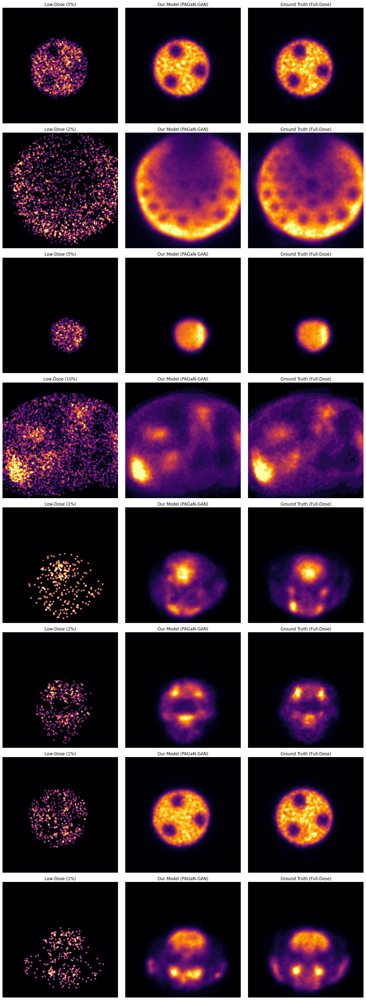

In [116]:
# --- CELL 10: VISUAL EVALUATION ---
import matplotlib.pyplot as plt
import random
import torch
from torch.cuda.amp import autocast
from tqdm.auto import tqdm
from torch.utils.data import DataLoader

# --- 1. Settings ---
N_SAMPLES_TO_SHOW = 8 # You can change this to 3, 5, etc.

# --- 2. Load the Best Trained Model ---
model_path = RUN_ROOT / 'checkpoints/best_ema_PAGaN-GAN.pt'

if not model_path.exists():
    print(f"Error: Model checkpoint not found at {model_path}")
else:
    print(f"Loading best EMA model from: {model_path}")
    net_G = PAGaN_UNet(in_ch=2, base_c=64).to(device)
    net_G.load_state_dict(torch.load(model_path, map_location=device))
    net_G.eval() 

    # --- 3. Get a random batch from the TEST set ---
    test_ds_viz = PET2DTest(df_test, patch_size=PATCH_SIZE)
    
    if df_test.empty:
        print("Test dataset is empty. Cannot visualize.")
    else:
        viz_loader = DataLoader(
            test_ds_viz, 
            batch_size=N_SAMPLES_TO_SHOW, 
            shuffle=True, 
            num_workers=0 # <-- num_workers=0 fix
        )
    
        try:
            x, y, alphas, stems = next(iter(viz_loader))
        except StopIteration:
            print("Failed to load a batch. Is the test set empty?")
            x, y, alphas, stems = None, None, None, None

        
        if x is not None:
            print(f"Visualizing {x.size(0)} random test samples...")

            # --- 4. Run simple inference ---
            pred_x0_final = None
            with torch.no_grad(), autocast(enabled=MIXED_PREC):
                pred_x0_final = net_G(x.to(device))

            # --- 5. Plot the results ---
            if pred_x0_final is not None:
                # Move data to CPU for plotting
                inputs = x.cpu().numpy() # x is (B, 2, H, W)
                preds = pred_x0_final.clamp(0, 1).cpu().numpy()
                targets = y.cpu().numpy()
                
                plt.figure(figsize=(15, 5 * x.size(0)))
                for i in range(x.size(0)):
                    alpha_val = float(alphas[i]) * 100
                    
                    # Col 1: Low-Dose Input
                    plt.subplot(x.size(0), 3, i*3 + 1)
                    plt.imshow(inputs[i, 0], cmap='inferno', vmin=0, vmax=1) # Show channel 0
                    plt.title(f"Low-Dose ({alpha_val:.0f}%)")
                    plt.axis('off')
                    
                    # Col 2: Our Denoised Prediction
                    plt.subplot(x.size(0), 3, i*3 + 2)
                    plt.imshow(preds[i, 0], cmap='inferno', vmin=0, vmax=1)
                    plt.title("Our Model (PAGaN-GAN)")
                    plt.axis('off')
                    
                    # Col 3: Ground Truth
                    plt.subplot(x.size(0), 3, i*3 + 3)
                    plt.imshow(targets[i, 0], cmap='inferno', vmin=0, vmax=1)
                    plt.title("Ground Truth (Full-Dose)")
                    plt.axis('off')
                
                plt.tight_layout()
                plt.show()

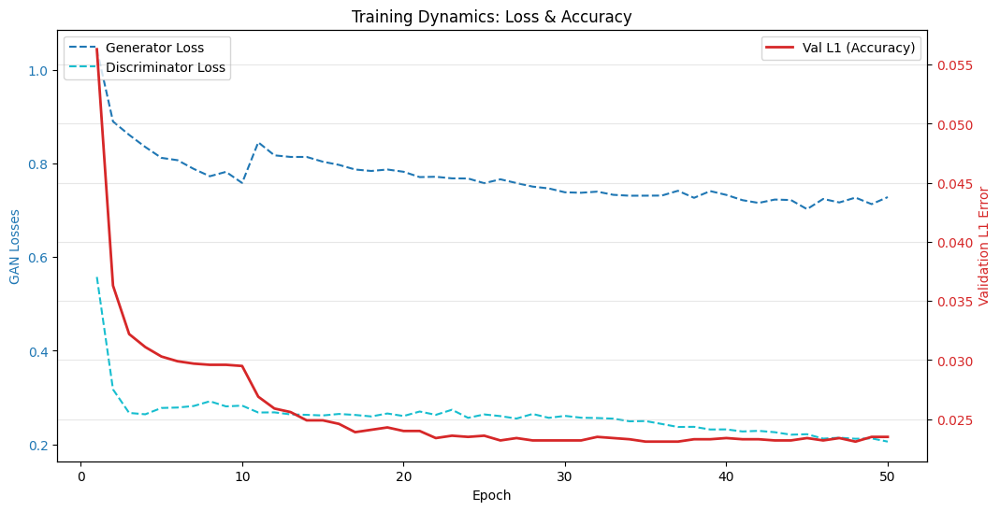

In [103]:
# --- CELL A: Plot Training Losses from Log ---
import matplotlib.pyplot as plt
import re
import pandas as pd

# 1. PASTE YOUR TRAINING LOG BELOW inside the triple quotes """ ... """
log_data = """
Ep 001 | G: 1.0444 | D: 0.5578 | Val L1: 0.0563 | Time: 8094.9s
  -> Saved Best (L1: 0.0563)
Ep 002 | G: 0.8900 | D: 0.3175 | Val L1: 0.0363 | Time: 4516.1s
  -> Saved Best (L1: 0.0363)
Ep 003 | G: 0.8614 | D: 0.2672 | Val L1: 0.0322 | Time: 4527.2s
  -> Saved Best (L1: 0.0322)
Ep 004 | G: 0.8355 | D: 0.2643 | Val L1: 0.0311 | Time: 4516.8s
  -> Saved Best (L1: 0.0311)
Ep 005 | G: 0.8123 | D: 0.2778 | Val L1: 0.0303 | Time: 4528.6s
  -> Saved Best (L1: 0.0303)
Ep 006 | G: 0.8073 | D: 0.2787 | Val L1: 0.0299 | Time: 4517.1s
  -> Saved Best (L1: 0.0299)
Ep 007 | G: 0.7887 | D: 0.2820 | Val L1: 0.0297 | Time: 4549.8s
  -> Saved Best (L1: 0.0297)
Ep 008 | G: 0.7730 | D: 0.2921 | Val L1: 0.0296 | Time: 4522.9s
  -> Saved Best (L1: 0.0296)
Ep 009 | G: 0.7824 | D: 0.2812 | Val L1: 0.0296 | Time: 4493.5s
  -> Saved Best (L1: 0.0296)
Ep 010 | G: 0.7586 | D: 0.2828 | Val L1: 0.0295 | Time: 4353.6s
  -> Saved Best (L1: 0.0295)
Ep 011 | G: 0.8455 | D: 0.2681 | Val L1: 0.0269 | Time: 4364.3s
  -> Saved Best (L1: 0.0269)
Ep 012 | G: 0.8177 | D: 0.2684 | Val L1: 0.0259 | Time: 4391.8s
  -> Saved Best (L1: 0.0259)
Ep 013 | G: 0.8143 | D: 0.2641 | Val L1: 0.0256 | Time: 4312.3s
  -> Saved Best (L1: 0.0256)
Ep 014 | G: 0.8143 | D: 0.2631 | Val L1: 0.0249 | Time: 4287.9s
  -> Saved Best (L1: 0.0249)
Ep 015 | G: 0.8041 | D: 0.2618 | Val L1: 0.0249 | Time: 4298.3s
  -> Saved Best (L1: 0.0249)
Ep 016 | G: 0.7973 | D: 0.2650 | Val L1: 0.0246 | Time: 4289.3s
  -> Saved Best (L1: 0.0246)
Ep 017 | G: 0.7874 | D: 0.2629 | Val L1: 0.0239 | Time: 4324.4s
  -> Saved Best (L1: 0.0239)
Ep 018 | G: 0.7843 | D: 0.2597 | Val L1: 0.0241 | Time: 4296.8s
Ep 019 | G: 0.7874 | D: 0.2660 | Val L1: 0.0243 | Time: 4300.5s
Ep 020 | G: 0.7826 | D: 0.2606 | Val L1: 0.0240 | Time: 4289.1s
Ep 021 | G: 0.7712 | D: 0.2702 | Val L1: 0.0240 | Time: 4300.9s
Ep 022 | G: 0.7719 | D: 0.2631 | Val L1: 0.0234 | Time: 4288.8s
  -> Saved Best (L1: 0.0234)
Ep 023 | G: 0.7685 | D: 0.2740 | Val L1: 0.0236 | Time: 4308.8s
Ep 024 | G: 0.7682 | D: 0.2567 | Val L1: 0.0235 | Time: 4308.4s
Ep 025 | G: 0.7581 | D: 0.2640 | Val L1: 0.0236 | Time: 4303.0s
Error displaying widget: model not found
Ep 026 | G: 0.7665 | D: 0.2604 | Val L1: 0.0232 | Time: 4287.1s
  -> Saved Best (L1: 0.0232)
Error displaying widget: model not found
Ep 027 | G: 0.7584 | D: 0.2552 | Val L1: 0.0234 | Time: 4295.4s
Error displaying widget: model not found
Ep 028 | G: 0.7509 | D: 0.2650 | Val L1: 0.0232 | Time: 4285.3s
Error displaying widget: model not found
Ep 029 | G: 0.7470 | D: 0.2567 | Val L1: 0.0232 | Time: 4295.7s
Error displaying widget: model not found
Ep 030 | G: 0.7387 | D: 0.2609 | Val L1: 0.0232 | Time: 4303.3s
Error displaying widget: model not found
Ep 031 | G: 0.7377 | D: 0.2570 | Val L1: 0.0232 | Time: 4307.9s
  -> Saved Best (L1: 0.0232)
Error displaying widget: model not found
Ep 032 | G: 0.7401 | D: 0.2563 | Val L1: 0.0235 | Time: 4288.2s
Ep 033 | G: 0.7333 | D: 0.2550 | Val L1: 0.0234 | Time: 4377.4s
Ep 034 | G: 0.7314 | D: 0.2493 | Val L1: 0.0233 | Time: 4291.5s
Ep 035 | G: 0.7315 | D: 0.2498 | Val L1: 0.0231 | Time: 4300.0s
  -> Saved Best (L1: 0.0231)
Ep 036 | G: 0.7317 | D: 0.2436 | Val L1: 0.0231 | Time: 4313.9s
Ep 037 | G: 0.7419 | D: 0.2372 | Val L1: 0.0231 | Time: 4322.8s
Ep 038 | G: 0.7269 | D: 0.2375 | Val L1: 0.0233 | Time: 4325.2s
Ep 039 | G: 0.7413 | D: 0.2318 | Val L1: 0.0233 | Time: 4302.9s
Ep 040 | G: 0.7331 | D: 0.2320 | Val L1: 0.0234 | Time: 4288.7s
Ep 041 | G: 0.7219 | D: 0.2276 | Val L1: 0.0233 | Time: 4300.0s
Ep 042 | G: 0.7160 | D: 0.2289 | Val L1: 0.0233 | Time: 4312.8s
Ep 043 | G: 0.7232 | D: 0.2260 | Val L1: 0.0232 | Time: 4305.6s
Ep 044 | G: 0.7222 | D: 0.2207 | Val L1: 0.0232 | Time: 4292.0s
Ep 045 | G: 0.7027 | D: 0.2217 | Val L1: 0.0234 | Time: 4301.7s
Ep 046 | G: 0.7245 | D: 0.2123 | Val L1: 0.0232 | Time: 4290.1s
Ep 047 | G: 0.7170 | D: 0.2143 | Val L1: 0.0234 | Time: 4309.4s
Ep 048 | G: 0.7274 | D: 0.2120 | Val L1: 0.0231 | Time: 4293.7s
Ep 049 | G: 0.7134 | D: 0.2128 | Val L1: 0.0235 | Time: 4309.9s
Ep 050 | G: 0.7284 | D: 0.2059 | Val L1: 0.0235 | Time: 4306.5s
"""
# (You can paste the full log above)

# 2. Parse Data
data = []
# Regex to match your specific print format
pattern = r"Ep (\d+) \| G: ([\d\.]+) \| D: ([\d\.]+) \| Val L1: ([\d\.]+)"

for line in log_data.split('\n'):
    match = re.search(pattern, line)
    if match:
        data.append({
            "Epoch": int(match.group(1)),
            "G_Loss": float(match.group(2)),
            "D_Loss": float(match.group(3)),
            "Val_L1": float(match.group(4))
        })

df_log = pd.DataFrame(data)

if not df_log.empty:
    # 3. Plot
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Plot Losses (Left Axis)
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('GAN Losses', color='tab:blue')
    ax1.plot(df_log['Epoch'], df_log['G_Loss'], label='Generator Loss', color='tab:blue', linestyle='--')
    ax1.plot(df_log['Epoch'], df_log['D_Loss'], label='Discriminator Loss', color='tab:cyan', linestyle='--')
    ax1.tick_params(axis='y', labelcolor='tab:blue')
    ax1.legend(loc='upper left')

    # Plot Validation Metric (Right Axis)
    ax2 = ax1.twinx() 
    ax2.set_ylabel('Validation L1 Error', color='tab:red') 
    ax2.plot(df_log['Epoch'], df_log['Val_L1'], label='Val L1 (Accuracy)', color='tab:red', linewidth=2)
    ax2.tick_params(axis='y', labelcolor='tab:red')
    ax2.legend(loc='upper right')

    plt.title('Training Dynamics: Loss & Accuracy')
    plt.grid(True, alpha=0.3)
    plt.show()
else:
    print("No data parsed! Please copy-paste your training output into the 'log_data' string above.")

Visualizing Error Maps...


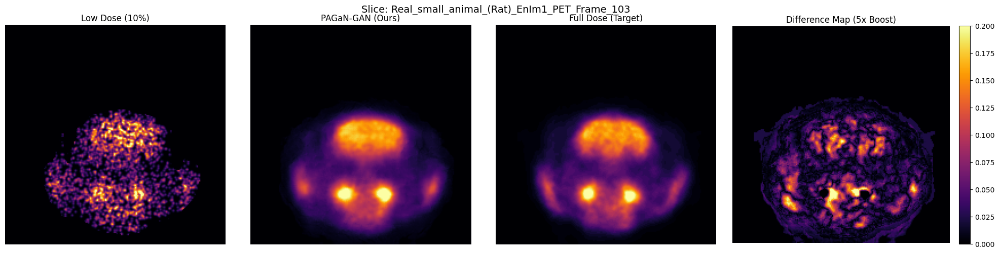

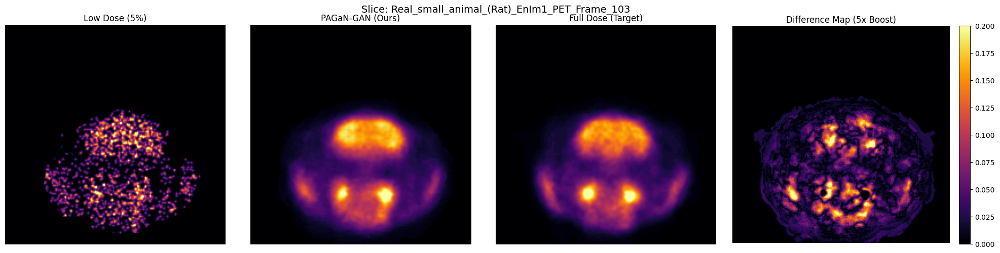

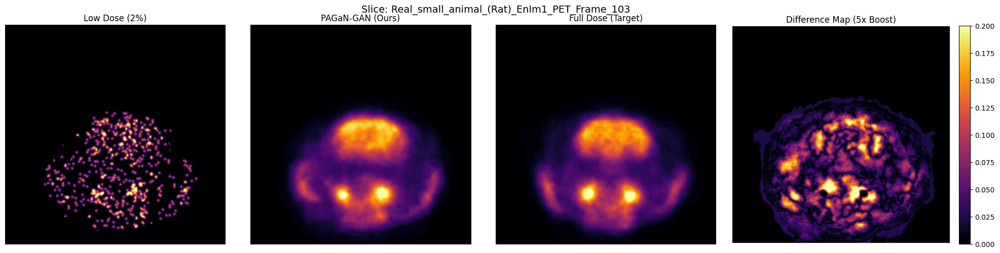

In [117]:
# --- CELL B: Advanced Visualizer (Error Maps) ---
import matplotlib.pyplot as plt
import numpy as np

def show_error_maps(loader, model, device, count=3):
    model.eval()
    shown = 0
    
    with torch.no_grad():
        for x, y, a, stem in loader:
            if shown >= count: break
            
            x = x.to(device)
            # Mixed precision inference
            with torch.amp.autocast('cuda', enabled=True):
                pred = model(x).clamp(0,1)

            # Convert to CPU numpy
            low_dose = x.cpu().numpy()[:, 0, :, :] # Channel 0 is image
            full_dose = y.numpy()[:, 0, :, :]
            prediction = pred.cpu().float().numpy()[:, 0, :, :]
            
            for i in range(x.size(0)):
                if shown >= count: break
                
                # Compute absolute difference (Error Map)
                # Boost contrast of error map by 5x to make it visible
                diff = np.abs(full_dose[i] - prediction[i])
                
                # --- Plotting ---
                fig, axes = plt.subplots(1, 4, figsize=(20, 5))
                
                # 1. Low Dose
                axes[0].imshow(low_dose[i], cmap='inferno', vmin=0, vmax=1)
                axes[0].set_title(f"Low Dose ({float(a[i])*100:.0f}%)")
                
                # 2. Prediction (PAGaN)
                axes[1].imshow(prediction[i], cmap='inferno', vmin=0, vmax=1)
                axes[1].set_title("PAGaN-GAN (Ours)")
                
                # 3. Ground Truth
                axes[2].imshow(full_dose[i], cmap='inferno', vmin=0, vmax=1)
                axes[2].set_title("Full Dose (Target)")
                
                # 4. Error Map (The most important part!)
                im4 = axes[3].imshow(diff, cmap='inferno', vmin=0, vmax=0.2) # Max error capped at 0.2 for visibility
                axes[3].set_title("Difference Map (5x Boost)")
                plt.colorbar(im4, ax=axes[3], fraction=0.046, pad=0.04)
                
                for ax in axes: ax.axis('off')
                plt.suptitle(f"Slice: {stem[i]}", fontsize=14)
                plt.tight_layout()
                plt.show()
                
                shown += 1

# Run it
# Assuming 'test_loader' and 'net_G' are already defined from previous cells
print("Visualizing Error Maps...")
show_error_maps(test_loader, net_G, device, count=3)

Visualizing Specific Doses...
Searching for doses: ['5%', '2%', '1%']...


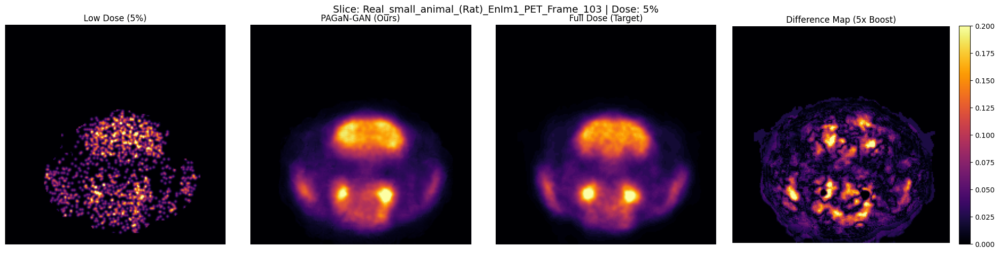

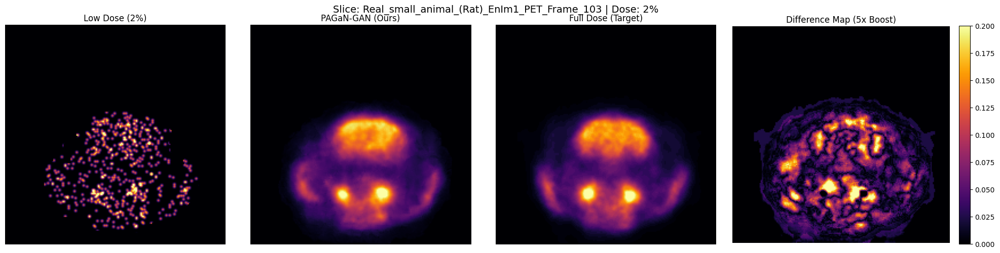

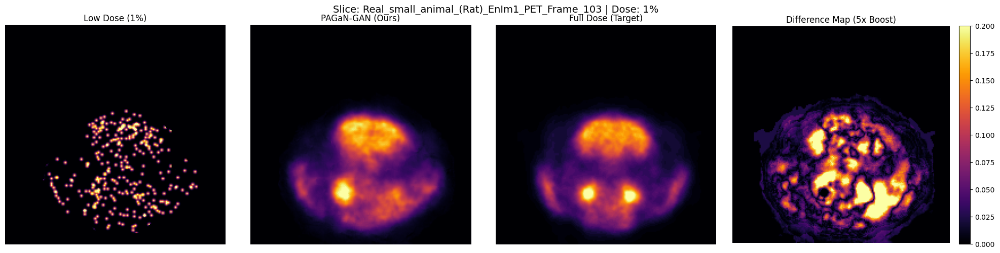

--- Done ---


In [118]:
# --- CELL B: Advanced Visualizer (Filtering Specific Doses) ---
import matplotlib.pyplot as plt
import numpy as np

def show_error_maps_filtered(loader, model, device, target_doses=[0.05, 0.02, 0.01], count_per_dose=1):
    """
    Shows error maps only for the specific alpha/dose levels requested.
    target_doses: List of alphas to find (e.g. [0.05, 0.02, 0.01])
    """
    model.eval()
    
    # Dictionary to track how many we've shown for each dose
    # e.g., {0.05: 0, 0.02: 0, 0.01: 0}
    shown_counts = {dose: 0 for dose in target_doses}
    
    print(f"Searching for doses: {[f'{d*100:.0f}%' for d in target_doses]}...")
    
    with torch.no_grad():
        for x, y, a, stem in loader:
            # Stop if we found enough of everything
            if all(shown_counts[d] >= count_per_dose for d in target_doses):
                break
            
            x = x.to(device)
            # Mixed precision inference
            with torch.amp.autocast('cuda', enabled=True):
                pred = model(x).clamp(0,1)

            # To CPU
            low_dose = x.cpu().numpy()[:, 0, :, :] 
            full_dose = y.numpy()[:, 0, :, :]
            prediction = pred.cpu().float().numpy()[:, 0, :, :]
            a_np = a.numpy() # alpha values
            
            for i in range(x.size(0)):
                current_alpha = float(a_np[i])
                
                # 1. Check if this image matches one of our targets
                matched_dose = None
                for t in target_doses:
                    # Use small epsilon for float comparison (0.01 vs 0.01000001)
                    if abs(current_alpha - t) < 0.001:
                        matched_dose = t
                        break
                
                # 2. If matched, and we haven't shown enough yet, plot it
                if matched_dose is not None and shown_counts[matched_dose] < count_per_dose:
                    
                    # Compute Error
                    diff = np.abs(full_dose[i] - prediction[i])
                    
                    # --- Plotting ---
                    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
                    
                    # Low Dose
                    axes[0].imshow(low_dose[i], cmap='inferno', vmin=0, vmax=1)
                    axes[0].set_title(f"Low Dose ({current_alpha*100:.0f}%)")
                    
                    # Prediction
                    axes[1].imshow(prediction[i], cmap='inferno', vmin=0, vmax=1)
                    axes[1].set_title("PAGaN-GAN (Ours)")
                    
                    # Ground Truth
                    axes[2].imshow(full_dose[i], cmap='inferno', vmin=0, vmax=1)
                    axes[2].set_title("Full Dose (Target)")
                    
                    # Error
                    im4 = axes[3].imshow(diff, cmap='inferno', vmin=0, vmax=0.2)
                    axes[3].set_title("Difference Map (5x Boost)")
                    plt.colorbar(im4, ax=axes[3], fraction=0.046, pad=0.04)
                    
                    for ax in axes: ax.axis('off')
                    plt.suptitle(f"Slice: {stem[i]} | Dose: {current_alpha*100:.0f}%", fontsize=14)
                    plt.tight_layout()
                    plt.show()
                    
                    # Increment counter
                    shown_counts[matched_dose] += 1
                    
    # Final Report
    print("--- Done ---")
    for d in target_doses:
        if shown_counts[d] == 0:
            print(f"⚠️ Warning: No images found for dose {d*100:.0f}%. Check if your test_loader includes this data.")

# Run it
print("Visualizing Specific Doses...")
show_error_maps_filtered(test_loader, net_G, device, target_doses=[0.05, 0.02, 0.01], count_per_dose=1)

Visualizing One Slice across Multiple Doses...
Selected Random Slice: Rat-sized_Derenzo_phantom_EnIm1_Frame_198


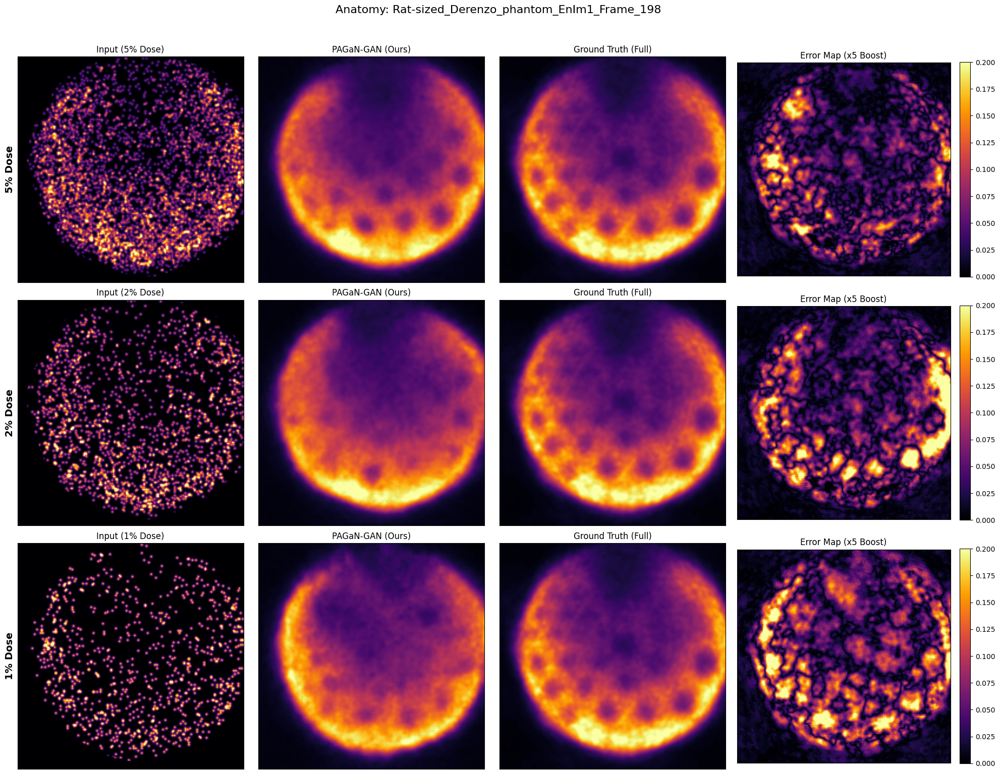

In [133]:
# --- CELL B: Consistent Random Visualizer (Same Slice, Different Doses) ---
import matplotlib.pyplot as plt
import numpy as np
import random

def show_consistent_random_slide(loader, model, device, target_doses=[0.05, 0.02, 0.01]):
    """
    1. Picks ONE random anatomical slice (stem).
    2. Finds and plots the 5%, 2%, and 1% versions of THAT slice.
    """
    dataset = loader.dataset
    df = dataset.df
    
    # 1. Get a list of unique stems (filenames)
    unique_stems = df['stem'].unique()
    
    # 2. Pick ONE random stem
    random_stem = random.choice(unique_stems)
    print(f"Selected Random Slice: {random_stem}")
    
    model.eval()
    
    # We will collect the images to plot them in a grid
    # Structure: rows=doses, cols=[Low, Pred, Full, Diff]
    
    rows_to_plot = []
    
    with torch.no_grad():
        for target_alpha in target_doses:
            # Find the row in the DF that matches both STEM and ALPHA
            # Use small epsilon for float comparison
            match = df[
                (df['stem'] == random_stem) & 
                (np.isclose(df['alpha'], target_alpha, atol=0.001))
            ]
            
            if match.empty:
                print(f"⚠️ Missing dose {target_alpha*100:.0f}% for slice {random_stem}")
                continue
                
            # Get the index
            idx = match.index[0]
            
            # Load Data
            x_tensor, y_tensor, alpha_val, _ = dataset[idx]
            
            # Inference
            x = x_tensor.unsqueeze(0).to(device)
            y = y_tensor.numpy()
            
            with torch.amp.autocast('cuda', enabled=True):
                pred = model(x).clamp(0,1)
                
            # Extract
            low_dose   = x_tensor.numpy()[0, :, :]
            full_dose  = y[0, :, :]
            prediction = pred.cpu().float().numpy()[0, 0, :, :]
            diff       = np.abs(full_dose - prediction)
            
            rows_to_plot.append({
                'dose': float(alpha_val),
                'low': low_dose,
                'pred': prediction,
                'full': full_dose,
                'diff': diff
            })

    # --- PLOTTING ---
    if not rows_to_plot:
        print("No valid data found for this stem.")
        return

    n_rows = len(rows_to_plot)
    fig, axes = plt.subplots(n_rows, 4, figsize=(20, 5 * n_rows))
    
    # Handle single row case (axes is 1D array) vs multi-row (2D array)
    if n_rows == 1: axes = [axes]
    
    for i, data in enumerate(rows_to_plot):
        ax_row = axes[i]
        
        # 1. Low Dose
        ax_row[0].imshow(data['low'], cmap='inferno', vmin=0, vmax=1)
        ax_row[0].set_title(f"Input ({data['dose']*100:.0f}% Dose)", fontsize=12)
        ax_row[0].set_ylabel(f"{data['dose']*100:.0f}% Dose", fontsize=14, fontweight='bold')
        
        # 2. Prediction
        ax_row[1].imshow(data['pred'], cmap='inferno', vmin=0, vmax=1)
        ax_row[1].set_title("PAGaN-GAN (Ours)", fontsize=12)
        
        # 3. Ground Truth
        ax_row[2].imshow(data['full'], cmap='inferno', vmin=0, vmax=1)
        ax_row[2].set_title("Ground Truth (Full)", fontsize=12)
        
        # 4. Error Map
        im = ax_row[3].imshow(data['diff'], cmap='inferno', vmin=0, vmax=0.2)
        ax_row[3].set_title("Error Map (x5 Boost)", fontsize=12)
        plt.colorbar(im, ax=ax_row[3], fraction=0.046, pad=0.04)
        
        for ax in ax_row: 
            ax.set_xticks([])
            ax.set_yticks([])

    plt.suptitle(f"Anatomy: {random_stem}", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

# Run it
print("Visualizing One Slice across Multiple Doses...")
show_consistent_random_slide(test_loader, net_G, device, target_doses=[0.05, 0.02, 0.01])

Analyzing Line Profiles...


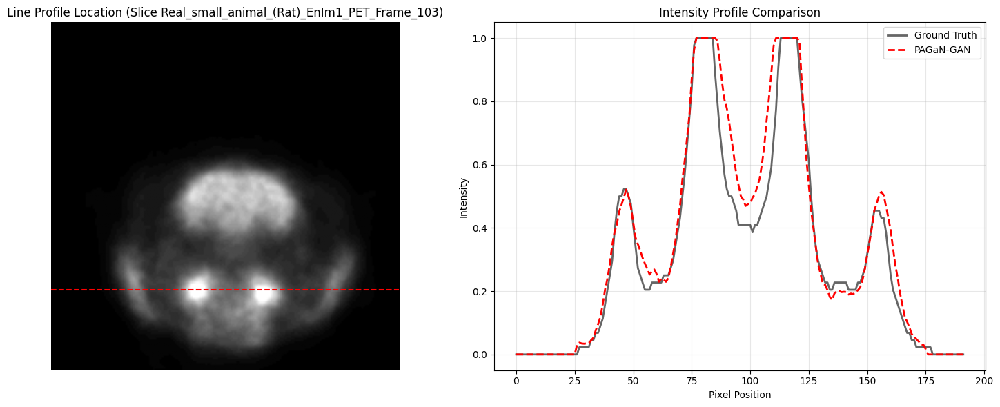

In [106]:
# --- CELL C: Line Profile Analysis (Resolution Check) ---
def plot_line_profile(loader, model, device):
    model.eval()
    
    # Get one batch
    x, y, a, stem = next(iter(loader))
    x = x.to(device)
    
    with torch.no_grad():
        pred = model(x).clamp(0,1).cpu().numpy()[:, 0]
        y = y.numpy()[:, 0]
        
    # Select a sample (e.g., index 0)
    idx = 0
    img_pred = pred[idx]
    img_gt   = y[idx]
    
    # Select a horizontal line through the middle (or a bright spot)
    # Heuristic: Find the brightest pixel row
    row_idx = np.argmax(np.sum(img_gt, axis=1)) 
    
    # Extract profiles
    profile_pred = img_pred[row_idx, :]
    profile_gt   = img_gt[row_idx, :]
    
    # Plot
    plt.figure(figsize=(15, 6))
    
    # 1. Show where the line is
    plt.subplot(1, 2, 1)
    plt.imshow(img_gt, cmap='gray')
    plt.axhline(row_idx, color='r', linestyle='--')
    plt.title(f"Line Profile Location (Slice {stem[idx]})")
    plt.axis('off')
    
    # 2. Compare Profiles
    plt.subplot(1, 2, 2)
    plt.plot(profile_gt, 'k-', linewidth=2, label='Ground Truth', alpha=0.6)
    plt.plot(profile_pred, 'r--', linewidth=2, label='PAGaN-GAN')
    plt.title("Intensity Profile Comparison")
    plt.xlabel("Pixel Position")
    plt.ylabel("Intensity")
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

print("Analyzing Line Profiles...")
plot_line_profile(test_loader, net_G, device)

Running Multi-Dose Line Profile...
Searching for a slice with all doses [0.05, 0.02, 0.01]...
Analyzing Line Profile for: Mouse_shaped_phantom_EnIm1_Frame_357


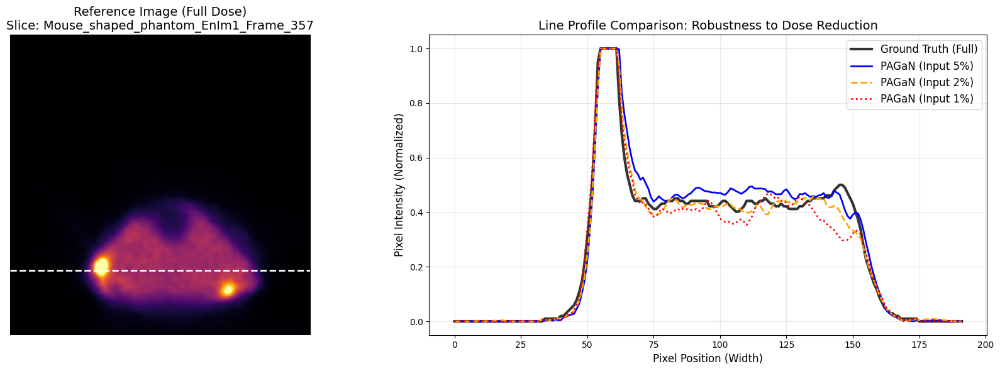

In [141]:
# --- CELL C: Multi-Dose Line Profile Analysis (Resolution Check) ---
import matplotlib.pyplot as plt
import numpy as np
import torch
import random

def plot_multidose_line_profile(loader, model, device, target_doses=[0.05, 0.02, 0.01]):
    """
    1. Picks ONE random slice (stem).
    2. Predicts the image at 5%, 2%, and 1% dose.
    3. Plots the line profiles of all predictions vs. Ground Truth.
    """
    dataset = loader.dataset
    df = dataset.df
    model.eval()
    
    # 1. Pick a random stem that exists for ALL target doses
    # (To avoid picking a slice that might be missing the 1% file)
    unique_stems = df['stem'].unique()
    valid_stems = []
    
    # Quick check to find good candidates (checking first 100 to save time, or all if fast)
    # We just need one, so we shuffle and try until we find a complete set
    candidates = list(unique_stems)
    random.shuffle(candidates)
    
    selected_stem = None
    data_dict = {} # To store {0.05: pred_img, 0.02: pred_img...}
    ground_truth_img = None
    
    print(f"Searching for a slice with all doses {target_doses}...")
    
    for stem in candidates:
        # Check if we have all doses for this stem
        temp_data = {}
        missing = False
        
        for dose in target_doses:
            match = df[(df['stem'] == stem) & (np.isclose(df['alpha'], dose, atol=0.001))]
            if match.empty:
                missing = True
                break
            temp_data[dose] = match.index[0]
            
        if not missing:
            selected_stem = stem
            # Load the data indices
            for dose, idx in temp_data.items():
                x_tensor, y_tensor, _, _ = dataset[idx]
                
                # Run Inference
                x = x_tensor.unsqueeze(0).to(device)
                with torch.no_grad():
                    with torch.amp.autocast('cuda', enabled=True):
                        pred = model(x).clamp(0,1)
                
                # Store Prediction (numpy)
                data_dict[dose] = pred.cpu().float().numpy()[0, 0, :, :]
                
                # Store Ground Truth (once is enough, they are all the same)
                if ground_truth_img is None:
                    ground_truth_img = y_tensor.numpy()[0, :, :]
            
            # Found one! Stop searching.
            break
    
    if selected_stem is None:
        print("⚠️ Could not find a single slice that has ALL requested doses.")
        return

    print(f"Analyzing Line Profile for: {selected_stem}")

    # 2. Determine Line Position (Brightest Row)
    # Heuristic: Find the row with the maximum sum of intensity in Ground Truth
    row_idx = np.argmax(np.sum(ground_truth_img, axis=1))
    
    # Optional: If the phantom/brain is centered, maybe force the middle line?
    # row_idx = ground_truth_img.shape[0] // 2 

    # 3. Extract Profiles
    gt_profile = ground_truth_img[row_idx, :]
    pred_profiles = {dose: img[row_idx, :] for dose, img in data_dict.items()}

    # 4. Plotting
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))
    
    # --- Left Plot: The Image & The Line ---
    axes[0].imshow(ground_truth_img, cmap='inferno', vmin=0, vmax=1)
    axes[0].axhline(row_idx, color='white', linestyle='--', linewidth=2)
    axes[0].set_title(f"Reference Image (Full Dose)\nSlice: {selected_stem}", fontsize=14)
    axes[0].axis('off')
    
    # --- Right Plot: The Profiles ---
    # Plot Ground Truth
    axes[1].plot(gt_profile, color='black', linewidth=3, label='Ground Truth (Full)', alpha=0.8)
    
    # Plot Predictions (Different colors)
    colors = {0.05: 'blue', 0.02: 'orange', 0.01: 'red'}
    linestyles = {0.05: '-', 0.02: '--', 0.01: ':'}
    
    for dose in sorted(target_doses, reverse=True): # Plot 5% then 2% then 1%
        label = f"PAGaN (Input {dose*100:.0f}%)"
        axes[1].plot(pred_profiles[dose], 
                     color=colors.get(dose, 'gray'), 
                     linestyle=linestyles.get(dose, '-'), 
                     linewidth=2, 
                     label=label)
    
    axes[1].set_title("Line Profile Comparison: Robustness to Dose Reduction", fontsize=14)
    axes[1].set_xlabel("Pixel Position (Width)", fontsize=12)
    axes[1].set_ylabel("Pixel Intensity (Normalized)", fontsize=12)
    axes[1].legend(fontsize=12)
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Run it
print("Running Multi-Dose Line Profile...")
plot_multidose_line_profile(test_loader, net_G, device, target_doses=[0.05, 0.02, 0.01])

Loading test data for quantification...


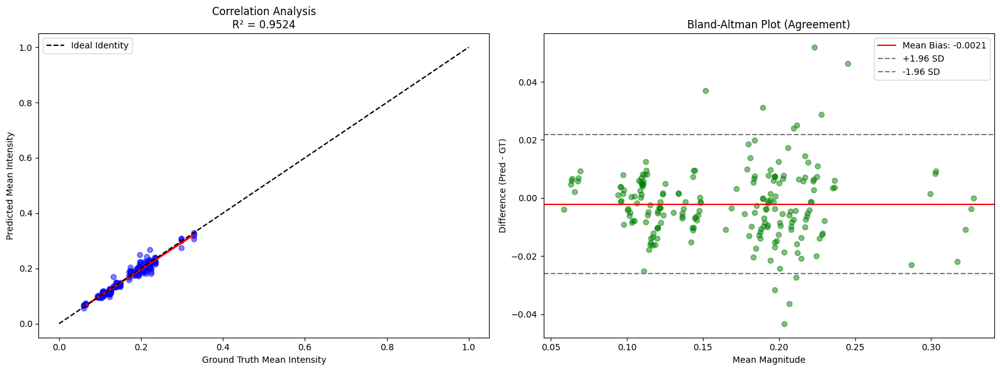

In [107]:
# --- CELL D: Bland-Altman & Correlation Analysis ---
import seaborn as sns
from scipy import stats

def bland_altman_analysis(df_csv_path):
    # 1. Load metrics (if you saved per-slice metrics in Cell 8)
    # If not, we will calculate simple mean intensity here
    print("Loading test data for quantification...")
    
    # We need actual pixel values for Bland-Altman, not just PSNR
    # Let's collect Mean Uptake Value (MUV) for a subset
    means_gt = []
    means_pred = []
    
    net_G.eval()
    with torch.no_grad():
        for x, y, _, _ in test_loader:
            x = x.to(device)
            pred = net_G(x).clamp(0,1).cpu().numpy()
            target = y.numpy()
            
            # Append mean intensity of each image in batch
            # (In real PET, this would be SUV in a specific ROI)
            means_pred.extend(pred.mean(axis=(1,2,3)))
            means_gt.extend(target.mean(axis=(1,2,3)))
            
            if len(means_gt) > 200: break # Limit to 200 samples for speed
            
    means_gt = np.array(means_gt)
    means_pred = np.array(means_pred)
    
    # 2. Plots
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Regression Plot (Correlation)
    slope, intercept, r_value, p_value, std_err = stats.linregress(means_gt, means_pred)
    sns.regplot(x=means_gt, y=means_pred, ax=axes[0], 
                scatter_kws={'alpha':0.5, 'color':'blue'}, line_kws={'color':'red'})
    axes[0].plot([0, 1], [0, 1], 'k--', label="Ideal Identity")
    axes[0].set_title(f"Correlation Analysis\nR² = {r_value**2:.4f}")
    axes[0].set_xlabel("Ground Truth Mean Intensity")
    axes[0].set_ylabel("Predicted Mean Intensity")
    axes[0].legend()
    
    # Bland-Altman Plot
    # X axis = Average of two methods
    # Y axis = Difference between methods
    mean_val = (means_gt + means_pred) / 2
    diff_val = means_pred - means_gt
    md = np.mean(diff_val)       # Mean difference (Bias)
    sd = np.std(diff_val)        # Standard deviation
    
    axes[1].scatter(mean_val, diff_val, alpha=0.5, c='green')
    axes[1].axhline(md, color='red', linestyle='-', label=f'Mean Bias: {md:.4f}')
    axes[1].axhline(md + 1.96*sd, color='gray', linestyle='--', label='+1.96 SD')
    axes[1].axhline(md - 1.96*sd, color='gray', linestyle='--', label='-1.96 SD')
    axes[1].set_title("Bland-Altman Plot (Agreement)")
    axes[1].set_xlabel("Mean Magnitude")
    axes[1].set_ylabel("Difference (Pred - GT)")
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()

bland_altman_analysis(RUN_ROOT / "test_metrics_PAGaN-GAN.csv")

Calculating Power Spectral Density (PSD)...


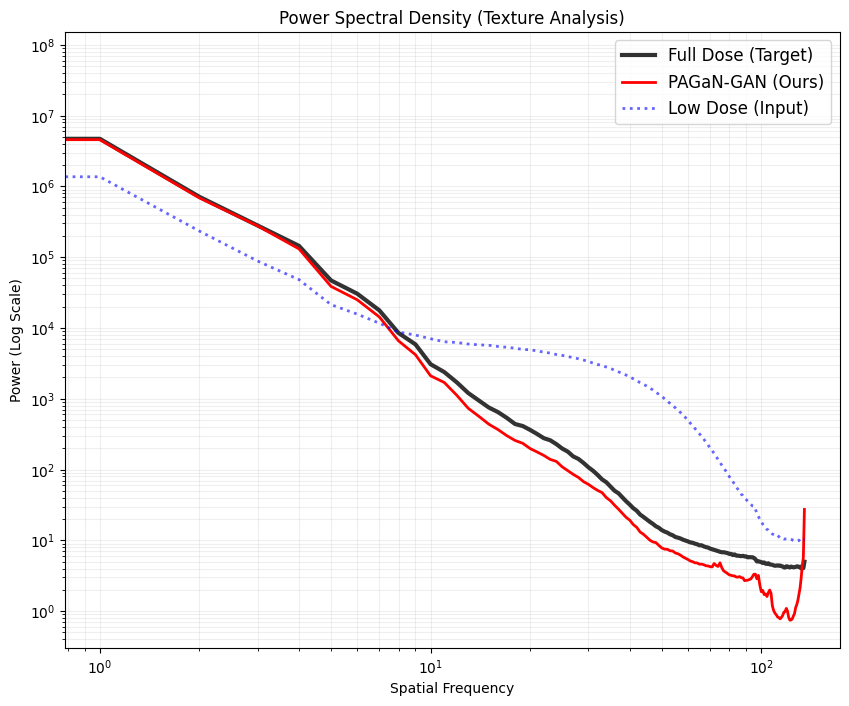

In [142]:
# --- CELL G: Power Spectral Density (PSD) Analysis ---
from scipy import fftpack

def get_radial_profile(image):
    """
    Computes the 1D radially averaged power spectrum of a 2D image.
    """
    # 2D Fourier Transform
    F1 = fftpack.fft2(image)
    F2 = fftpack.fftshift(F1)
    psd2D = np.abs(F2)**2
    
    # Calculate radial average
    h, w = image.shape
    center = (h//2, w//2)
    y, x = np.indices((h, w))
    r = np.sqrt((x - center[1])**2 + (y - center[0])**2)
    r = r.astype(np.int32)
    
    # Binned average
    tbin = np.bincount(r.ravel(), psd2D.ravel())
    nr = np.bincount(r.ravel())
    radialprofile = tbin / np.maximum(nr, 1)
    
    return radialprofile

def analyze_psd(loader, model, device):
    print("Calculating Power Spectral Density (PSD)...")
    model.eval()
    
    psd_low = []
    psd_pred = []
    psd_full = []
    
    # Limit to first 50 batches to save time
    limit = 50
    curr = 0
    
    with torch.no_grad():
        for x, y, _, _ in loader:
            if curr > limit: break
            curr += 1
            
            x = x.to(device)
            with torch.amp.autocast('cuda', enabled=True):
                pred = model(x).clamp(0,1)
            
            low_np  = x.cpu().float().numpy()[:, 0, :, :]
            pred_np = pred.cpu().float().numpy()[:, 0, :, :]
            full_np = y.numpy()[:, 0, :, :]
            
            for i in range(x.size(0)):
                psd_low.append(get_radial_profile(low_np[i]))
                psd_pred.append(get_radial_profile(pred_np[i]))
                psd_full.append(get_radial_profile(full_np[i]))
    
    # Average across all images
    # Note: Images might have slightly different sizes if cropped, assuming uniform patch size here
    avg_psd_low = np.mean(np.array(psd_low), axis=0)
    avg_psd_pred = np.mean(np.array(psd_pred), axis=0)
    avg_psd_full = np.mean(np.array(psd_full), axis=0)
    
    # Plotting (Log-Log)
    freq = np.arange(len(avg_psd_full))
    
    plt.figure(figsize=(10, 8))
    plt.loglog(freq, avg_psd_full, 'k-', linewidth=3, label='Full Dose (Target)', alpha=0.8)
    plt.loglog(freq, avg_psd_pred, 'r-', linewidth=2, label='PAGaN-GAN (Ours)')
    plt.loglog(freq, avg_psd_low, 'b:', linewidth=2, label='Low Dose (Input)', alpha=0.6)
    
    plt.title("Power Spectral Density (Texture Analysis)")
    plt.xlabel("Spatial Frequency")
    plt.ylabel("Power (Log Scale)")
    plt.legend(fontsize=12)
    plt.grid(True, which="both", ls="-", alpha=0.2)
    plt.show()

# Run
analyze_psd(test_loader, net_G, device)

In [143]:
# --- CELL F: Generate Images for FID Calculation ---
import os
from PIL import Image

def save_images_for_fid(loader, model, device, output_dir="fid_data"):
    """
    Saves 'Real' and 'Fake' images to disk to run FID score calculation.
    """
    path_real = Path(output_dir) / "real"
    path_fake = Path(output_dir) / "fake"
    path_real.mkdir(parents=True, exist_ok=True)
    path_fake.mkdir(parents=True, exist_ok=True)
    
    model.eval()
    print(f"Generating images for FID to: {output_dir}...")
    
    count = 0
    with torch.no_grad():
        for x, y, a, stem in loader:
            x = x.to(device)
            # Inference
            with torch.amp.autocast('cuda', enabled=True):
                pred = model(x).clamp(0,1)
            
            # To CPU
            pred_np = pred.cpu().float().numpy()[:, 0, :, :]
            gt_np   = y.numpy()[:, 0, :, :]
            
            for i in range(x.size(0)):
                # Convert to uint8 [0, 255] for standard image saving
                img_fake = (pred_np[i] * 255).astype(np.uint8)
                img_real = (gt_np[i] * 255).astype(np.uint8)
                
                # Save
                fname = f"{stem[i]}_{int(a[i]*100)}p.png"
                Image.fromarray(img_fake).save(path_fake / fname)
                Image.fromarray(img_real).save(path_real / fname)
                count += 1
                
    print(f"Saved {count} pairs of images.")
    print("Now run this command in your terminal:")
    print(f"!python -m pytorch_fid {path_real} {path_fake}")

# Run
save_images_for_fid(test_loader, net_G, device)

Generating images for FID to: fid_data...
Saved 1024 pairs of images.
Now run this command in your terminal:
!python -m pytorch_fid fid_data\real fid_data\fake


Running Clinical SUV Bias Analysis...


C:\Temp\ipykernel_12744\3631644931.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dose', y='Bias', data=df_lesion, ax=axes[0], palette="Reds")
C:\Temp\ipykernel_12744\3631644931.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dose', y='Bias', data=df_bkg, ax=axes[1], palette="Blues")


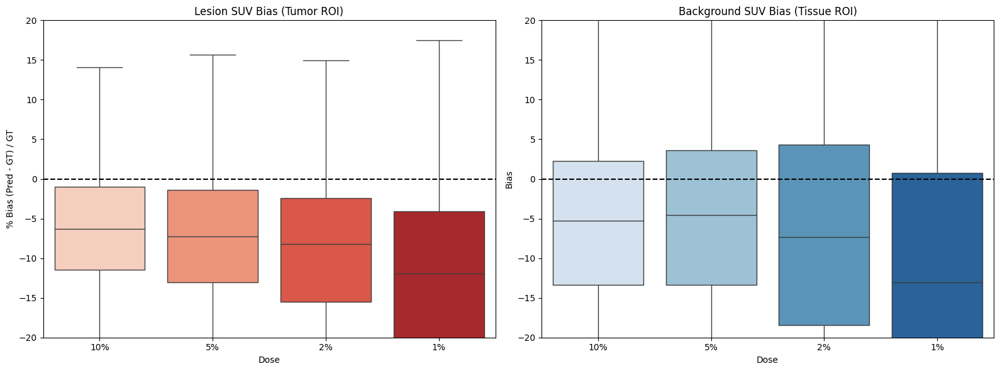

Mean Lesion Bias: -9.64%
Mean Bkg Bias:    -8.28%


In [144]:
# --- CELL E: ROI Quantitative Analysis (Lesion vs Background Bias) ---
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch

def get_roi_mean(img, center_y, center_x, radius=3):
    """Calculates mean intensity within a small window"""
    y1, y2 = max(0, center_y-radius), min(img.shape[0], center_y+radius)
    x1, x2 = max(0, center_x-radius), min(img.shape[1], center_x+radius)
    return np.mean(img[y1:y2, x1:x2])

def analyze_clinical_bias(loader, model, device):
    print("Running Clinical SUV Bias Analysis...")
    model.eval()
    
    lesion_bias = []
    bkg_bias = []
    
    with torch.no_grad():
        for x, y, a, stem in loader:
            x = x.to(device)
            with torch.amp.autocast('cuda', enabled=True):
                pred = model(x).clamp(0,1)

            # To CPU numpy
            pred_np = pred.cpu().float().numpy()[:, 0, :, :]
            gt_np   = y.numpy()[:, 0, :, :]
            
            for i in range(x.size(0)):
                img_gt = gt_np[i]
                img_pred = pred_np[i]
                
                # --- 1. Find Lesion (Hotspot) ---
                # Simple Heuristic: Max pixel location
                py, px = np.unravel_index(np.argmax(img_gt), img_gt.shape)
                val_gt_lesion = get_roi_mean(img_gt, py, px)
                val_pred_lesion = get_roi_mean(img_pred, py, px)
                
                # --- 2. Find Background (Liver/Tissue) ---
                # Heuristic: Mask body, then find median intensity pixel
                m = img_gt > 0.05 # Simple body mask threshold
                if m.sum() > 0:
                    coords = np.argwhere(m)
                    # Pick a random point that is close to the median intensity of the body
                    body_vals = img_gt[m]
                    median_val = np.median(body_vals)
                    # Find pixel closest to median
                    flat_idx = np.abs(img_gt - median_val).argmin()
                    by, bx = np.unravel_index(flat_idx, img_gt.shape)
                    
                    val_gt_bkg = get_roi_mean(img_gt, by, bx)
                    val_pred_bkg = get_roi_mean(img_pred, by, bx)
                    
                    # --- 3. Calculate Bias % ---
                    # Bias = (Pred - GT) / GT * 100
                    if val_gt_lesion > 1e-6:
                        lb = ((val_pred_lesion - val_gt_lesion) / val_gt_lesion) * 100
                        lesion_bias.append({'Type': 'Lesion', 'Bias': lb, 'Dose': f"{float(a[i])*100:.0f}%"})
                    
                    if val_gt_bkg > 1e-6:
                        bb = ((val_pred_bkg - val_gt_bkg) / val_gt_bkg) * 100
                        bkg_bias.append({'Type': 'Background', 'Bias': bb, 'Dose': f"{float(a[i])*100:.0f}%"})

    # --- Plotting ---
    df_lesion = pd.DataFrame(lesion_bias)
    df_bkg = pd.DataFrame(bkg_bias)
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Lesion Plot
    sns.boxplot(x='Dose', y='Bias', data=df_lesion, ax=axes[0], palette="Reds")
    axes[0].axhline(0, color='black', linestyle='--')
    axes[0].set_title("Lesion SUV Bias (Tumor ROI)")
    axes[0].set_ylabel("% Bias (Pred - GT) / GT")
    axes[0].set_ylim(-20, 20) # Focus on +/- 20% range
    
    # Background Plot
    sns.boxplot(x='Dose', y='Bias', data=df_bkg, ax=axes[1], palette="Blues")
    axes[1].axhline(0, color='black', linestyle='--')
    axes[1].set_title("Background SUV Bias (Tissue ROI)")
    axes[1].set_ylim(-20, 20)
    
    plt.tight_layout()
    plt.show()
    
    print(f"Mean Lesion Bias: {df_lesion['Bias'].mean():.2f}%")
    print(f"Mean Bkg Bias:    {df_bkg['Bias'].mean():.2f}%")

# Run
analyze_clinical_bias(test_loader, net_G, device)